pip install openpyxl

In [3]:
import pandas as pd
import glob
from sklearn.decomposition import PCA, FastICA
from sklearn.preprocessing import StandardScaler, Normalizer
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.linear_model import LinearRegression, LogisticRegression, ElasticNet
from sklearn.ensemble import ExtraTreesRegressor, ExtraTreesClassifier, RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.cluster import KMeans, FeatureAgglomeration
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import time
import numpy as np
import pickle
import seaborn as sns
import re
from utils import getEncodings, getTypes, encode, saveExcelSheetsToCsv, resize
from fuzzywuzzy import fuzz
pd.options.display.max_colwidth = 100
sep = '|'

In [64]:
def SpRank(X, y):
    X2 = {x : i for i,x in enumerate(sorted(X))}
    y2 = {x : i for i,x in enumerate(sorted(y))}
    df = pd.DataFrame({'X' : X, 'y' : y})
    df['X_rank'] = df['X'].apply(X2.__getitem__)
    df['y_rank'] = df['y'].apply(y2.__getitem__)
    return df[['X_rank', 'y_rank']].corr()['y_rank'].values[0]

def SpRankTest(X, y):
    X = np.array(X)
    ranks = []
    for i in range(X.shape[1]):
        ranks.append(SpRank(X[:, i], y))
        
    return ranks
def getMeanErrorStats(y_observed, y_predicted, samples = 10, sample_elements = 50):
    sample_diffs = []
    for _ in range(samples):
        sample_indicies = [np.random.randint(0,len(y_observed)) for __ in range(sample_elements)]
        y_test1 = y_predicted[sample_indicies]
        y_test2 = y_observed[sample_indicies]
        sample_diffs.append((np.mean(y_test1) - np.mean(y_test2))/np.mean(y_test2))
    mn = np.mean(sample_diffs)
    sd = np.std(sample_diffs)
    mn = max(mn, abs(np.mean(y_observed) - np.mean(y_predicted))/np.mean(y_observed))
    return mn, sd
def dropUnbalancedColumns(df):
    columns_to_drop = []
    for col in df:
        uns = df[col].unique()
        if len(uns) == 2:
            cnts = df[col].value_counts()
            if max(cnts[uns[0]], cnts[uns[1]])/min(cnts[uns[0]], cnts[uns[1]]) > 10:
                columns_to_drop.append(col)
    df = df.drop(columns = columns_to_drop)
    return df

In [5]:
with open("Encodings_2022.dat", 'rb') as f:
    encodings = pickle.load(f)
with open("DroppableColumns.dat", 'rb') as f:
    droppable = pickle.load(f)

In [6]:
df_orig = pd.read_csv("..\\raw_csv\\2022_Annual_Survey_Aggregate_Data_for_2022_Annual_Survey_20220905222712-SurveyExport.csv", sep = sep)
for x in df_orig:
    if df_orig[x].isna().sum() == len(df_orig):
        df_orig.drop(columns = x)
df_orig = df_orig[df_orig.apply(lambda x : sum([pd.isna(y) for y in x])/len(x) < 0.5, axis = 1)]
df_orig = df_orig[~df_orig['Hope Scale Score'].isna()]
is_military = df_orig['Are you, or were you ever, an active member of the military or member of the National Guard or Reserve?'] == 'Yes'
df_orig_military = df_orig[is_military]
df_orig_civ = df_orig[~is_military]

In [5]:
x = 'What is your gender?'
uns = df[x].unique()
if len(uns) < 11:
    tmp = df.copy()
    cnts = {}
    mx_cnt = 0
    for un in uns:
        cnts[un] = (df[x] == un).sum()
        mx_cnt = max(cnts[un], mx_cnt)
    for un in cnts:
        if cnts[un] < mx_cnt/5:
            tmp = tmp[tmp[x] != un]
    val_cnts = df.groupby(x).agg({'Hope Scale Score' : 'mean'})
    scores[x] = val_cnts.max() - val_cnts.min()
uns

NameError: name 'df' is not defined

In [7]:
scores = {}
for x in df:
    if 'hope' in x.lower():
        continue
    uns = df[x].unique()
    if len(uns) < 11:
        tmp = df.copy()
        cnts = {}
        mx_cnt = 0
        for un in uns:
            cnts[un] = (df[x] == un).sum()
            mx_cnt = max(cnts[un], mx_cnt)
        for un in cnts:
            if cnts[un] < mx_cnt/25:
                tmp = tmp[tmp[x] != un]
        val_cnts = tmp.groupby(x).agg({'Hope Scale Score' : 'median'})
        scores[x] = (val_cnts.max() - val_cnts.min()).values[0]
    else:
        UPPER_score = df.loc[(df[x] == df[x].quantile(.75)), 'Hope Scale Score'].values[0]
        LOWER_score = df.loc[(df[x] == df[x].quantile(.25)), 'Hope Scale Score'].values[0]
        scores[x] = abs(UPPER_score - LOWER_score)

NameError: name 'df' is not defined

In [136]:
df['Please indicate how long you have been waiting for a resolution of your un-resolved claims.'].unique()

array([2., 3., 5., 4., 1.])

In [65]:
sorted(scores.items(), key = lambda x : x[1], reverse = True)

[('I am able to adapt when changes occur:Please indicate how frequently you find each statement below to be truthful to you:',
  36.0),
 ('Care deeply about my well being:To what extent do you disagree or agree with the following statements regardingÂ\xa0veteran serving organizations within your community?',
  27.0),
 ('There are opportunities for active military members/veterans in my community:To what extent do you disagree or agree with the following statements:',
  26.0),
 ('Seeking Value', 24.0),
 ('pca_5_squared', 24.0),
 ('Years Of Service', 23.0),
 ('My community is invested in active military/veterans:To what extent do you disagree or agree with the following statements:',
  22.5),
 ('Are highly responsive:To what extent do you disagree or agree with the following statements regardingÂ\xa0veteran serving organizations within your community?',
  21.5),
 ('pca_4', 21.0),
 ('Organizations in my community provide active military/veterans with the services they need:To what extent 

In [53]:
df = df_orig_military.copy()
replacements_dictionary = {'Yes' : 1,
                          'No' : 0,
                          "I don't know/unsure" : 0.5,
                           'Prefer not to respond' : 0.5,
                           'Unknown' : 0.5,
                           'Unsure' : 0.5,
                          'Seeking' : 1,
                          'Not Seeking': 0}
feet_col = 'Feet:'
inch_col = 'Inches:'
srvc_start_col = "What year did you begin your time in the service? (Ex: 1985)"
srvc_end_col = "What year did your status become retired/discharged? (Ex: 2006)"
non_question_columns = {"Response ID", "Time Started", "Date Submitted", 
                        "Status", "Language", "Referer", "SessionID",
                       "Legacy Comments", "Comments", "User Agent", "Tags", 
                        "Contact Information- Non Military Connected",
                       "What is your zip code?"}
non_question_columns = ['Response ID',
 'Time Started',
 'Date Submitted',
 'Status',
 'Language',
 'Referer',
 'SessionID',
 'What is your zip code?',
                       "Time Started"]
#df = df.fillna(-1)
# question_columns = [x for x in df if not x in non_question_columns and not x in droppableColumns]

question_columns = [x for x in df if not x in non_question_columns]

df = df[question_columns]
df['Service Start Decade'] = df[srvc_start_col].apply(round, args = [-1])
df[feet_col] = df[feet_col].apply(lambda x : np.nan if isinstance(x, str) else x).astype('float')
df['Height In Inches'] = (12 * df[feet_col] + 
df[inch_col].apply(lambda x: np.nan if isinstance(x, str) else x).astype('float')).copy()
df[srvc_end_col] = df[srvc_end_col].apply(lambda x : np.nan if isinstance(x, str) else x).astype('float')
df[srvc_start_col] = df[srvc_start_col].apply(lambda x: np.nan if isinstance(x, str) else x).astype('float')
df['Years Of Service'] = (df[srvc_end_col] - df[srvc_start_col]).apply(lambda x : np.nan if x < 0 else x)
df['Length Of Service In Decades'] = df['Years Of Service']//10
df = df.drop(columns = [feet_col, inch_col, srvc_end_col])
droppableColumns = []
for col in df:
    num_na = df[col].isna().sum()
    if (num_na > 1 and df[col].dropna().nunique() == 1) or num_na > len(df) * (.8):
        df[col] = df[col].isna()
    if num_na == len(df):
        droppableColumns.append(col)
    df[col] = df[col].fillna(df[col].mode().values[0])
    try: df[col] = df[col].fillna(df[col].mean())
    except: None
df = df.drop(columns = droppableColumns)

In [54]:
df = encode(df, encodings)
droppableColumns = []
for col in df:
    num_na = df[col].isna().sum()
    if (num_na > 1 and df[col].dropna().nunique() == 1) or num_na > len(df) * (.8):
        df[col] = df[col].isna()
    if num_na == len(df):
        droppableColumns.append(col)
    df[col] = df[col].fillna(df[col].mode().values[0])
    try: df[col] = df[col].fillna(df[col].mean())
    except: None
df = df.drop(columns = droppableColumns)
question_columns = [x for x in df if not x in non_question_columns]
df = encode(df, encodings)
df = df[question_columns]
df = df.replace(replacements_dictionary)
df = df.drop(columns = [x for x in df.dtypes[df.dtypes == 'O'].index])
df = dropUnbalancedColumns(df)
df['Has reliable transportation?'] = df['What is your primary mode of transportation?'].isin([7.0, 2.0])
df['Owns a car?'] = df['What is your primary mode of transportation?'].isin([7.0])
df['Has Community Opportunities?'] = df['There are opportunities for active military members/veterans in my community:To what extent do you disagree or agree with the following statements:']>= 2
df["Needs Housing Assistance?"] = (~df["Housing statusÂ\xa0"].isin([1.0, 4.0, 5.0]))
df['Has Medical Insurance?'] = (~df['Veterans Affairs (VA):What type of health insurance coverage do you currently have for yourself?Â\xa0 Please check all that apply.'])
df['Veteran serving organizations care deeply about my well being?'] = (df['Care deeply about my well being:To what extent do you disagree or agree with the following statements regardingÂ\xa0veteran serving organizations within your community?'] >= 2)
df['Community is involved with veterans?'] = (df['My community is invested in active military/veterans:To what extent do you disagree or agree with the following statements:'] >= 2)
df['Seeking Value'] = df[[x for x in df if 'seek' in x]].apply(sum, axis = 1)
df['Has Dependable Support?'] = df['There are people I can depend on to help me if I really need it:To what extent do you disagree or agree with the following statements:'] >=2

In [55]:
pca = PCA()
df_pca_cols = [x for x in df if not 'hope' in x.lower()]
df_pca = pca.fit_transform(Normalizer().fit_transform(df[df_pca_cols]))
df_pca = pd.DataFrame({f'pca_{i}': df_pca[:,i] for i in range(df_pca.shape[1])})

scs = {col : SpRank(df_pca[col].values, df['Hope Scale Score'].values) for col in df_pca}
scs2 = {col : SpRank((df_pca[col]**2).values, df['Hope Scale Score'].values)  for col in df_pca}
mn = np.mean([abs(x) for x in scs.values()])
sd = np.std([abs(x) for x in scs.values()])
scs = {col : scs[col] for col in scs if abs(scs[col]) > (mn+3*sd)}
for pca_col in scs:
    df[pca_col] = df_pca[pca_col].values
mn = np.mean([abs(x) for x in scs2.values()])
sd = np.std([abs(x) for x in scs2.values()])
scs2 = {col : scs2[col] for col in scs2 if abs(scs2[col]) > (mn+3*sd)}
for pca_col in scs2:
    df[pca_col+'_squared'] = (df_pca[pca_col]**2).values

In [56]:
catagory_columns = [x for x in df if df[x].nunique() <= 10 and not 'Hope' in x]
non_catagory_columns = [x for x in df if not x in catagory_columns and not 'Hope' in x]
ANOVA = SelectKBest(f_classif, k = 7)
ANOVA.fit_transform(df[catagory_columns], df['Hope Scale Score'])
catagory_columns_filtered = ANOVA.get_feature_names_out()

K:\Anaconda\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:112: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
K:\Anaconda\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:113: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


In [57]:
random_state = 42
pred_col = 'Hope Scale Score'
derived_columns = {'There are opportunities for active military members/veterans in my community:To what extent do you disagree or agree with the following statements:',
                  'What is your primary mode of transportation?',
                  'Veterans Affairs (VA):What type of health insurance coverage do you currently have for yourself?Â\xa0 Please check all that apply.',
                  "Housing statusÂ\xa0",
                  'Care deeply about my well being:To what extent do you disagree or agree with the following statements regardingÂ\xa0veteran serving organizations within your community?',
                  'My community is invested in active military/veterans:To what extent do you disagree or agree with the following statements:',
                  'There are people I can depend on to help me if I really need it:To what extent do you disagree or agree with the following statements:'}
'''
impact_columns = {
            'Owns a car?' : True,
    'Has reliable transportation?' : True,
    'Has Community Opportunities?' : True,
    "Needs Housing Assistance?" : False,
    'Has Medical Insurance?' : True,
    'Veteran serving organizations care deeply about my well being?' : True,
    'Community is involved with veterans?' : True,
    'Has Dependable Support?' : True
}
'''
impact_columns = {
    'Veteran serving organizations care deeply about my well being?' : True,
    'Community is involved with veterans?' : True,
    'Has Dependable Support?' : True
}
scale_columns = [x for x in non_catagory_columns]
predictors = sorted([y for y in set([x for x in catagory_columns_filtered] + 
              [ x for x in non_catagory_columns] + 
              [x for x in impact_columns] +
            ['Owns a car?', "Needs Housing Assistance?", 'Has Medical Insurance?', 'Has Community Opportunities?',
            'Has reliable transportation?']) if not y in derived_columns]
            )
XX = df[predictors]
YY = df[pred_col]
X2, x, Y, y = train_test_split(XX, YY, random_state = random_state, test_size = 0.60)

params = {'n_estimators' : [i*50 + 37 for i in range(5)],
          'max_features' : [None],
          'max_depth' : [None, 10, 15, 20, 25],
          'bootstrap' : [True],
          'random_state' : [random_state]
         }
model_ = ExtraTreesRegressor(n_jobs = -1)


x_scaler = StandardScaler()
# x_scaler = Normalizer()
X2[scale_columns] = x_scaler.fit_transform(X2[scale_columns])
model = GridSearchCV(model_, param_grid = params)
model.fit(X2.values, Y)

GridSearchCV(estimator=ExtraTreesRegressor(n_jobs=-1),
             param_grid={'bootstrap': [True],
                         'max_depth': [None, 10, 15, 20, 25],
                         'max_features': [None],
                         'n_estimators': [37, 87, 137, 187, 237],
                         'random_state': [42]})

Veteran serving organizations care deeply about my well being?
Average Hope Scale Score Impact Due to intervention: 8.06% (±1.08%) Increase For 16% Of Service Men And Women
(2.75±0.37 raw average, 258±35 raw overall)

Community is involved with veterans?
Average Hope Scale Score Impact Due to intervention: 7.05% (±0.9%) Increase For 20% Of Service Men And Women
(2.56±0.33 raw average, 309±39 raw overall)

Has Dependable Support?
Average Hope Scale Score Impact Due to intervention: 11.14% (±1.63%) Increase For 15% Of Service Men And Women
(3.78±0.55 raw average, 333±49 raw overall)



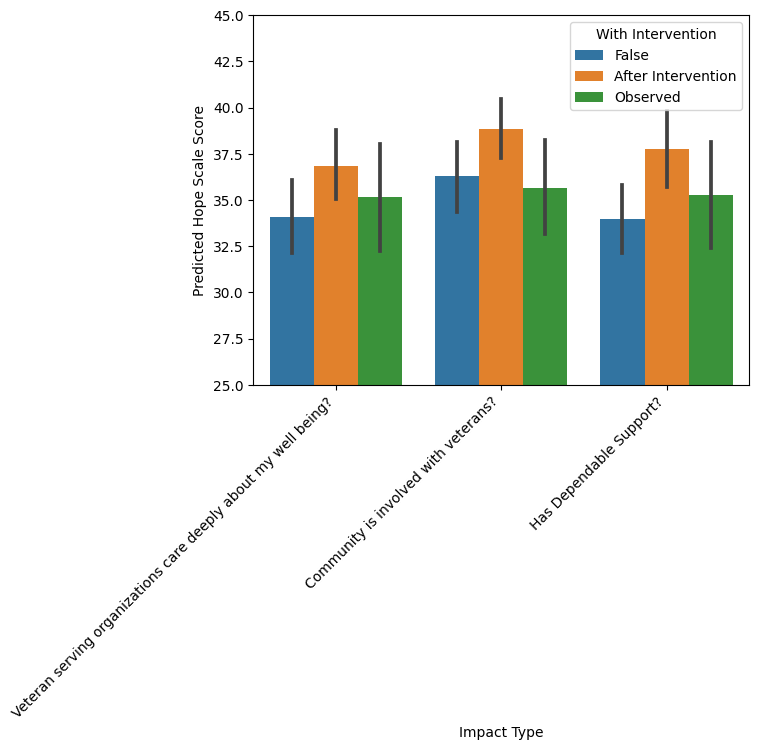

In [66]:
x2 = x.copy()
x2[scale_columns] = x_scaler.transform(x2[scale_columns])
x2 = x2.values
predicted = []
predicted_with_intervention = []
df_plots = []
for impact_column in impact_columns:
    
    x3 = x.copy()
    x3[impact_column] = impact_columns[impact_column]

    x3[scale_columns] = x_scaler.transform(x3[scale_columns])
    x3 = x3.values
    noeq_index = (x3[:, predictors.index(impact_column)] 
                  != x2[:, predictors.index(impact_column)])
    x_Observed = x2[noeq_index]
    x_Speculated = x3[noeq_index]
    
    y_pred = model.predict(x_Observed)
    y_pred2 = model.predict(x_Speculated)
    diff = y_pred2-y_pred
    #y_pred = y_pred[diff>0]
    #y_pred2 = y_pred2[diff>0]
    #y_observed = y.values[noeq_index][diff>0]
    y_observed = y.values[noeq_index]
    y_mn = np.mean(y_pred)
    y_mn2 = np.mean(y_pred2)
    mean_error, std_error = getMeanErrorStats(y_observed, y_pred, samples = 1000, sample_elements = 25)
    error = mean_error + 2*std_error
    relative_increase = round((100 * (y_mn2 - y_mn)/y_mn), 2)
    rel_error = round(relative_increase*error,2)
    net_overall_increase = int(round(np.sum((y_pred2 - y_pred))))
    net_err = int(round(net_overall_increase*error))
    absolute_average_increase = round(y_mn2 - y_mn, 2)
    absolute_err = round(absolute_average_increase*error, 2)
    percent_afflicted = round(100 * len(y_pred)/len(x))
    print(impact_column)
    print(f"Average Hope Scale Score Impact Due to intervention: {relative_increase}% (" u"\u00B1" + f"{rel_error}%) Increase For {percent_afflicted}% Of Service Men And Women")
    print(f"({absolute_average_increase}" + u"\u00B1" + f"{absolute_err} raw average, {net_overall_increase}" + u"\u00B1" + f"{net_err} raw overall)")
    print()
    df_plot = pd.DataFrame({'Hope Scale Score': (3 * [z for z in y_observed]),
                           'Predicted Hope Scale Score' : [z for z in y_pred] + [z for z in y_pred2] + [z for z in y_observed],
                           'With Intervention' : ([False for x in y_pred] + ['After Intervention' for x in y_pred2] + 
                                                  ['Observed' for x in y_observed] ),
                          'Impact Type' : 3 * [impact_column for z in y_observed]})
    predicted.append(y_mn)
    predicted_with_intervention.append(y_mn2)
    #ax = sns.lmplot(data = df_plot, x = 'Hope Scale Score', y = 'Predicted Hope Scale Score', hue = 'With Intervention', scatter = False)
    #plt.show()
    df_plots.append(df_plot)
df_plot2 = pd.concat(df_plots, ignore_index = True)
ax = sns.barplot(data = df_plot2, y = 'Predicted Hope Scale Score', x = "Impact Type", hue = 'With Intervention')
ax.set(ylim = (25, 45))
ax.set_xticks(ax.get_xticks(), ax.get_xticklabels(), rotation=45, ha='right')
plt.show()

In [59]:
print(model.score(x2, y))
y_pred = model.predict(x2)
print(round(np.mean(y_pred), 2))
print(round(np.mean(y.values), 2))

0.6015585229479061
44.48
44.64


In [60]:
model_lr = LinearRegression()
pca_lr = PCA(n_components = 7)
X_pca = pca_lr.fit_transform(X2)
x_pca = pca_lr.transform(x2)
model_lr.fit(X2, Y)

K:\Anaconda\lib\site-packages\sklearn\base.py:409: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(


LinearRegression()

In [45]:
model_lr.score(x2, y)

K:\Anaconda\lib\site-packages\sklearn\base.py:409: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


0.3807892865944482

K:\Anaconda\lib\site-packages\sklearn\base.py:409: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
K:\Anaconda\lib\site-packages\sklearn\base.py:409: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
K:\Anaconda\lib\site-packages\sklearn\base.py:409: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
K:\Anaconda\lib\site-packages\sklearn\base.py:409: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
K:\Anaconda\lib\site-packages\sklearn\base.py:409: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(
K:\Anaconda\lib\site-packages\sklearn\base.py:409: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  w

Veteran serving organizations care deeply about my well being?
Average Hope Scale Score Impact Due to intervention: 10.1% (±3.18%) Increase For 16% Of Service Men And Women
(3.2±1.01 raw average, 301±95 raw overall)

Community is involved with veterans?
Average Hope Scale Score Impact Due to intervention: 3.19% (±0.81%) Increase For 20% Of Service Men And Women
(1.1±0.28 raw average, 133±34 raw overall)

Has Dependable Support?
Average Hope Scale Score Impact Due to intervention: 12.61% (±4.17%) Increase For 15% Of Service Men And Women
(4.03±1.33 raw average, 355±117 raw overall)



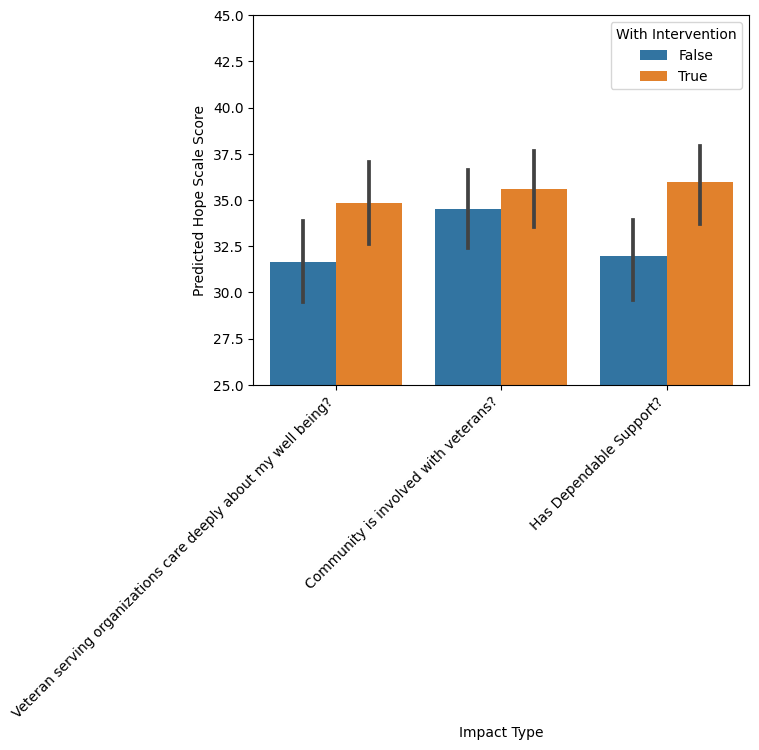

In [65]:
x2 = x.copy()
x2[scale_columns] = x_scaler.transform(x2[scale_columns])
x2 = x2.values
predicted = []
predicted_with_intervention = []
df_plots = []
for impact_column in impact_columns:
    
    x3 = x.copy()
    x3[impact_column] = impact_columns[impact_column]

    x3[scale_columns] = x_scaler.transform(x3[scale_columns])
    x3 = x3.values
    noeq_index = (x3[:, predictors.index(impact_column)] 
                  != x2[:, predictors.index(impact_column)])
    x_Observed = x2[noeq_index]
    x_Speculated = x3[noeq_index]
    
    y_pred = model_lr.predict(x_Observed)
    y_pred2 = model_lr.predict(x_Speculated)
    diff = y_pred2-y_pred
    y_pred = y_pred[diff>0]
    if len(y_pred) == 0:
        continue
    y_pred2 = y_pred2[diff>0]
    y_observed = y.values[noeq_index][diff>0]
    y_mn = np.mean(y_pred)
    y_mn2 = np.mean(y_pred2)
    mean_error, std_error = getMeanErrorStats(y_observed, y_pred, samples = 1000, sample_elements = 25)
    error = mean_error + 4*std_error
    relative_increase = round((100 * (y_mn2 - y_mn)/y_mn), 2)
    rel_error = round(relative_increase*error,2)
    net_overall_increase = int(round(np.sum((y_pred2 - y_pred))))
    net_err = int(round(net_overall_increase*error))
    absolute_average_increase = round(y_mn2 - y_mn, 2)
    absolute_err = round(absolute_average_increase*error, 2)
    percent_afflicted = round(100 * len(y_pred)/len(x))
    print(impact_column)
    print(f"Average Hope Scale Score Impact Due to intervention: {relative_increase}% (" u"\u00B1" + f"{rel_error}%) Increase For {percent_afflicted}% Of Service Men And Women")
    print(f"({absolute_average_increase}" + u"\u00B1" + f"{absolute_err} raw average, {net_overall_increase}" + u"\u00B1" + f"{net_err} raw overall)")
    print()
    df_plot = pd.DataFrame({'Hope Scale Score': (2 * [z for z in y_observed]),
                           'Predicted Hope Scale Score' : [z for z in y_pred] + [z for z in y_pred2],
                           'With Intervention' : [False for x in y_pred] + [True for x in y_pred2],
                          'Impact Type' : 2 * [impact_column for z in y_observed]})
    predicted.append(y_mn)
    predicted_with_intervention.append(y_mn2)
    #ax = sns.lmplot(data = df_plot, x = 'Hope Scale Score', y = 'Predicted Hope Scale Score', hue = 'With Intervention', scatter = False)
    #plt.show()
    df_plots.append(df_plot)
df_plot2 = pd.concat(df_plots, ignore_index = True)
ax = sns.barplot(data = df_plot2, y = 'Predicted Hope Scale Score', x = "Impact Type", hue = 'With Intervention')
ax.set(ylim = (25, 45))
ax.set_xticks(ax.get_xticks(), ax.get_xticklabels(), rotation=45, ha='right')
plt.show()

In [49]:
y_observed

array([], dtype=float64)

In [18]:
sns.scatterplot(x = y.values[:, 0], y = y_pred[:, 0])

IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

In [290]:
x3 = np.array([[z for z in y] for y in x2 ])
x3[:, seek_ind] = 0
x_pca2 = pca.transform(x3)

In [19]:
np.mean(y_pred)
np.mean(y.values)

44.43461030383091

In [20]:
sum(model.predict(x_pca2) - model.predict(x_pca))

NameError: name 'x_pca2' is not defined

In [122]:
model3 = GridSearchCV(model_, param_grid = params)
predictions = []
test_data = []
for model, model_features in zip(models,[linear_cols, sq_cols]):#zip(models,[model1_features, model2_features]):
    
    X2 = X[model_features]
    x2 = x[model_features]
    
    X2 = x_scaler.fit_transform(X2)
    x2 = x_scaler.transform(x2)
    
    test_data.append(model.predict(x2))
    predictions.append(model.predict(X2))

X3 = pd.DataFrame({'feature1' : predictions[0] , 'feature2' : predictions[1]})
x3 = pd.DataFrame({'feature1' : test_data[0] , 'feature2' : test_data[1]})
n_pcas = 21
pca = PCA(n_components = n_pcas)
x_scaler = StandardScaler()
X_pca = pca.fit_transform(x_scaler.fit_transform(X[linear_cols]))
x_pca = pca.fit_transform(x_scaler.transform(x[linear_cols]))
pca_cols = ['pca_'  + str(i) for i in range(n_pcas)]
X3[pca_cols] = X_pca
x3[pca_cols] = x_pca
model3.fit(X3,Y)
model3.score(x3,y)

NameError: name 'linear_cols' is not defined

In [ ]:
import copy
DT_model = GridSearchCV(DecisionTreeRegressor(), param_grid = {
    "criterion" : ["squared_error", "friedman_mse", "absolute_error", "poisson"],
    "splitter" : ["best", "random"],
    "max_depth" : [None, 2, 5, 10, 15, 20, 25],
    "random_state" : [42]
})
X3 = copy.copy(X2)
X3[pd.isna(X3)] = 0
DT_model.fit(X3, Y)

In [267]:
fig = plt.figure(figsize  = (10*18,10*12))
x = plot_tree(DT_model.best_estimator_, 
              feature_names = [resize(col.split(':')[0]) for col in model_features], 
              filled = True,
             max_depth = 2)
#plt.savefig('plots_2022/DescisionTree_3.png')

In [268]:
DT_model.score(x2,y)

0.43535863973913624

<AxesSubplot: >

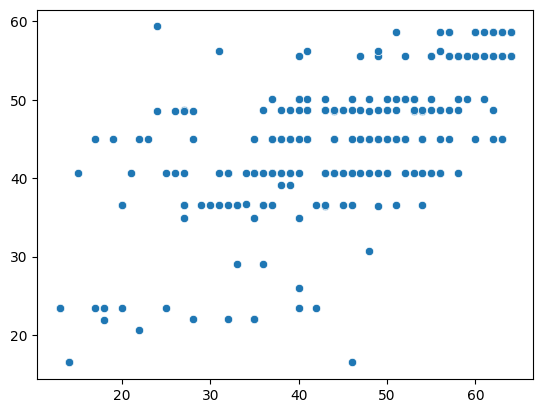

In [269]:
y_pred = DT_model.predict(x2)
sns.scatterplot(y = y_scaler.inverse_transform(y_pred.reshape(-1,1))[:,0],
                x = y_scaler.inverse_transform(y)[:,0])

In [247]:
pd.DataFrame({"prediction" : y_scaler.inverse_transform(y_pred.reshape(-1,1))[:,0], 
              "observation"  : y_scaler.inverse_transform(y)[:,0]}).corr()

,prediction,observation
prediction,1.000000,0.672661
observation,0.672661,1.000000


In [321]:
def matchColumns(col_set1, col_set2):
    col_set2 = set(col_set2)
    matches = {}
    skip_cols = set()
    for col1 in col_set1:
        possibleMatches = [k[0] for k in sorted([[col2, fuzz.token_set_ratio(col1, col2)] 
                                                 for col2 in col_set2], 
                                 key = lambda z : z[1], reverse = True)[:5]]
        for col2 in possibleMatches:
            if col2 in matches:
                continue
            print('---- Column 1', col1)
            print('---- Column 2', col2)
            print()
            a = input()
            if a.lower() == 'y':
                matches[col2] = col1
                break
            if a.lower() == 'drop':
                col_set2.remove(col2)
    return matches

In [233]:
s = X_corr['Hope Scale Score'].std()

In [236]:
X_corr = X[predictors + ['Hope Scale Score']].corr()[['Hope Scale Score']]
correlation_index = X_corr[(~X_corr['Hope Scale Score'].isna() ) & (X_corr['Hope Scale Score'].apply(abs)>(s))].sort_values('Hope Scale Score').index

In [296]:
linear_cols

[]

In [240]:
correlation_index

Index(['Do you smoke cigarettes and how often? (if yes, use scale)',
       'Are you at risk of becoming homeless?',
       'sleep/relax:After a long day how do you relax or cope with stress; are you more likely to: (Check all that apply)',
       'Service status (Most recent or current status)Â ',
       'Do you know your credit score?_0',
       'Do you have a VA disability claim pending?Â ',
       'What do you practice? (Optional) Â ',
       'Veterans Affairs (VA):What type of health insurance coverage do you currently have for yourself?Â  Please check all that apply.',
       'Have you participated in adaptive sports programs?Â _1',
       'Sporting events not related to a school, college, or university:Which type of community events do you attend (select all that apply)?Â ',
       'exercise (recreational):After a long day how do you relax or cope with stress; are you more likely to: (Check all that apply)',
       'In the last 12 months, have you had a VA mental health appointm

In [115]:
random_state = 42
cols = []
scores = []
pred_col = 'Hope Scale Score'
predictors = [x for x in df if x != pred_col and not 'Attestation' in x and not 'hope' in x.lower()]
XX = df[predictors]
#XX = df[accum_features]
YY = df[[pred_col]]
X, x, Y, y = train_test_split(XX, YY, random_state = random_state)
y_scaler = StandardScaler()
x_scaler = StandardScaler()
Y = y_scaler.fit_transform(Y)
y = y_scaler.transform(y)
X2 = x_scaler.fit_transform(X)
x2 = x_scaler.transform(x)
for col in predictors:
    
    i = predictors.index(col)
    model = ExtraTreesRegressor()
    Y2 = Y
    y2 = y
    model.fit(X2[:, i].reshape(-1,1), Y2)
    score = model.score(x2[:, i].reshape(-1,1), y2)
    scores.append(score)
    cols.append(col)
model = LinearRegression()
model.fit(X2, Y)
score = model.score(x2, y)
print(score)

C:\Users\Sean\AppData\Local\Temp\ipykernel_11808\3748630978.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2[:, i].reshape(-1,1), Y2)
C:\Users\Sean\AppData\Local\Temp\ipykernel_11808\3748630978.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2[:, i].reshape(-1,1), Y2)
C:\Users\Sean\AppData\Local\Temp\ipykernel_11808\3748630978.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2[:, i].reshape(-1,1), Y2)
C:\Users\Sean\AppData\Local\Temp\ipykernel_11808\3748630978.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using r

C:\Users\Sean\AppData\Local\Temp\ipykernel_11808\3748630978.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2[:, i].reshape(-1,1), Y2)
C:\Users\Sean\AppData\Local\Temp\ipykernel_11808\3748630978.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2[:, i].reshape(-1,1), Y2)
C:\Users\Sean\AppData\Local\Temp\ipykernel_11808\3748630978.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2[:, i].reshape(-1,1), Y2)
C:\Users\Sean\AppData\Local\Temp\ipykernel_11808\3748630978.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using r

C:\Users\Sean\AppData\Local\Temp\ipykernel_11808\3748630978.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2[:, i].reshape(-1,1), Y2)
C:\Users\Sean\AppData\Local\Temp\ipykernel_11808\3748630978.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2[:, i].reshape(-1,1), Y2)
C:\Users\Sean\AppData\Local\Temp\ipykernel_11808\3748630978.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2[:, i].reshape(-1,1), Y2)
C:\Users\Sean\AppData\Local\Temp\ipykernel_11808\3748630978.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using r

C:\Users\Sean\AppData\Local\Temp\ipykernel_11808\3748630978.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2[:, i].reshape(-1,1), Y2)
C:\Users\Sean\AppData\Local\Temp\ipykernel_11808\3748630978.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2[:, i].reshape(-1,1), Y2)
C:\Users\Sean\AppData\Local\Temp\ipykernel_11808\3748630978.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2[:, i].reshape(-1,1), Y2)
C:\Users\Sean\AppData\Local\Temp\ipykernel_11808\3748630978.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using r

C:\Users\Sean\AppData\Local\Temp\ipykernel_11808\3748630978.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2[:, i].reshape(-1,1), Y2)
C:\Users\Sean\AppData\Local\Temp\ipykernel_11808\3748630978.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2[:, i].reshape(-1,1), Y2)
C:\Users\Sean\AppData\Local\Temp\ipykernel_11808\3748630978.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2[:, i].reshape(-1,1), Y2)
C:\Users\Sean\AppData\Local\Temp\ipykernel_11808\3748630978.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using r

C:\Users\Sean\AppData\Local\Temp\ipykernel_11808\3748630978.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2[:, i].reshape(-1,1), Y2)
C:\Users\Sean\AppData\Local\Temp\ipykernel_11808\3748630978.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2[:, i].reshape(-1,1), Y2)
C:\Users\Sean\AppData\Local\Temp\ipykernel_11808\3748630978.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2[:, i].reshape(-1,1), Y2)
C:\Users\Sean\AppData\Local\Temp\ipykernel_11808\3748630978.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using r

C:\Users\Sean\AppData\Local\Temp\ipykernel_11808\3748630978.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2[:, i].reshape(-1,1), Y2)
C:\Users\Sean\AppData\Local\Temp\ipykernel_11808\3748630978.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2[:, i].reshape(-1,1), Y2)
C:\Users\Sean\AppData\Local\Temp\ipykernel_11808\3748630978.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2[:, i].reshape(-1,1), Y2)
C:\Users\Sean\AppData\Local\Temp\ipykernel_11808\3748630978.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using r

C:\Users\Sean\AppData\Local\Temp\ipykernel_11808\3748630978.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2[:, i].reshape(-1,1), Y2)


In [110]:
for col in linear_preds:
    
    XX = df[[k for k in linear_preds if k!= col]]
    #XX = df[accum_features]
    YY = df[[pred_col]]
    X, x, Y, y = train_test_split(XX, YY, random_state = random_state)
    y_scaler = StandardScaler()
    x_scaler = StandardScaler()
    Y = y_scaler.fit_transform(Y)
    y = y_scaler.transform(y)
    X2 = x_scaler.fit_transform(X)
    x2 = x_scaler.transform(x)
    model = LinearRegression()
    model.fit(X2, Y)
    score = model.score(x2, y)
    if score > 0:
        print(score)
        print(col)
        break

0.4741609968768046
Other - Write In:What is your degree/certification field of study?


In [116]:
sorted_cols = sorted(zip(scores, cols), key = lambda x : abs(x[0]))

In [505]:
XX = df[['pca_1', 'pca_0', 'pca_5', 'pca_3', 'pca_8', 'pca_24', 'pca_127'] + [ x for x in non_catagory_columns]]
#XX = df[accum_features]
YY = df[[pred_col]]
X, x, Y, y = train_test_split(XX, YY, random_state = random_state)
Y = y_scaler.fit_transform(Y)
y = y_scaler.transform(y)
model = LinearRegression()
model.fit(X, Y)
score = model.score(x, y)
print(score)

0.5129300078339911


In [297]:
scores = []
scores2 = []
cols = []
for col in df:
    if 'hope' in col.lower():
        continue
    XX = df[[col]]
    #XX = df[accum_features]
    YY = df[[pred_col]]
    X, x, Y, y = train_test_split(XX, YY, random_state = random_state)
    y_scaler = StandardScaler()
    x_scaler = StandardScaler()
    Y = y_scaler.fit_transform(Y)
    y = y_scaler.transform(y)
    X2 = x_scaler.fit_transform(X)
    x2 = x_scaler.transform(x)
    model = LinearRegression()
    model.fit(X2, Y)
    score = model.score(x2, y)
    scores.append(score)
    cols.append(col)
    print('--- LINEAR ---')
    print(score)
    print(col)
    model = LinearRegression()
    model.fit(X2**2, Y)
    score = model.score(x2**2, y)
    scores2.append(score)
    print('--- SQUARED ---')
    print(score)
    print(col)

linear_cols = [x[0] for x in sorted(zip(cols, scores, scores2), key = lambda x: x[1]) if x[1] >= x[2] and x[1] > 0.05]
sq_cols = [x[0] for x in sorted(zip(cols, scores, scores2), key = lambda x: x[2]) if x[2] > x[1] and x[2] > 0.05]

--- LINEAR ---
-0.0015257501211596303
Are you, or were you ever, an active member of the military or member of the National Guard or Reserve?
--- SQUARED ---
-0.0015257501211596303
Are you, or were you ever, an active member of the military or member of the National Guard or Reserve?
--- LINEAR ---
-0.003177227395561033
Have you ever received information or assistance fromÂ veteran serving organizations within your community?
--- SQUARED ---
-0.003177227395561033
Have you ever received information or assistance fromÂ veteran serving organizations within your community?
--- LINEAR ---
-0.0022976613427998505
What is your gender?
--- SQUARED ---
-0.002293085560136854
What is your gender?
--- LINEAR ---
-0.00016163704517513366
Gender (Optional):
--- SQUARED ---
-0.00016163704517513366
Gender (Optional):
--- LINEAR ---
0.017874650497831213
Post-9/11 era (September 11, 2001 - Present):Service era (Select all that apply)
--- SQUARED ---
0.017874650497831213
Post-9/11 era (September 11, 2001 -

--- LINEAR ---
0.005911141150936605
Do you have health insurance coverage?
--- SQUARED ---
0.005911141150936605
Do you have health insurance coverage?
--- LINEAR ---
-0.0012261068964658506
Private health insurance, HMO, PPO (e.g., employer-sponsored health plan):What type of health insurance coverage do you currently have for yourself?Â  Please check all that apply.
--- SQUARED ---
-0.0012261068964654065
Private health insurance, HMO, PPO (e.g., employer-sponsored health plan):What type of health insurance coverage do you currently have for yourself?Â  Please check all that apply.
--- LINEAR ---
-0.006378237980880108
Medicare:What type of health insurance coverage do you currently have for yourself?Â  Please check all that apply.
--- SQUARED ---
-0.006378237980880108
Medicare:What type of health insurance coverage do you currently have for yourself?Â  Please check all that apply.
--- LINEAR ---
0.0014814199198789346
Medicaid:What type of health insurance coverage do you currently have 

--- SQUARED ---
0.04703092722296609
Have improved my community's understanding of active military/veterans issues:To what extent do you disagree or agree with the following statements regardingÂ veteran serving organizations within your community?
--- LINEAR ---
0.08236295177859776
Have connected me to other veterans:To what extent do you disagree or agree with the following statements regardingÂ veteran serving organizations within your community?
--- SQUARED ---
0.03383033747679909
Have connected me to other veterans:To what extent do you disagree or agree with the following statements regardingÂ veteran serving organizations within your community?
--- LINEAR ---
0.06237716542378868
Have connected my family/caregiver to other active military/veteran family members or their caregivers:To what extent do you disagree or agree with the following statements regardingÂ veteran serving organizations within your community?
--- SQUARED ---
0.041321790569039285
Have connected my family/caregiv

--- SQUARED ---
-0.00409116010746402
How likely is it that you would recommend your communityÂ to a veteran or friend? Please use the scale below to indicate your likelihood to recommend someone to live in your community. Â 
--- LINEAR ---
-0.0015841785432630928
Purpose in Life:Please select the top 3 most important factors as it pertains to a job?Â 
--- SQUARED ---
-0.0015841785432630928
Purpose in Life:Please select the top 3 most important factors as it pertains to a job?Â 
--- LINEAR ---
-0.0015925454214595902
Family (Spouse/Kids/Parents):Please select the top 3 most important factors as it pertains to a job?Â 
--- SQUARED ---
-0.0015925454214595902
Family (Spouse/Kids/Parents):Please select the top 3 most important factors as it pertains to a job?Â 
--- LINEAR ---
-0.0015925454214595902
Community Connections:Please select the top 3 most important factors as it pertains to a job?Â 
--- SQUARED ---
-0.0015925454214595902
Community Connections:Please select the top 3 most important f

--- LINEAR ---
0.00532599026676428
Mental health conditions include anxiety, depression, post-traumatic stress disorder (PTSD), traumatic brain injury (TBI), migraines / severe headaches, military sexual trauma, and sleep problems:Please indicate which type of medical conditions you are not currently receiving treatment for (select all that apply):
--- SQUARED ---
0.00532599026676428
Mental health conditions include anxiety, depression, post-traumatic stress disorder (PTSD), traumatic brain injury (TBI), migraines / severe headaches, military sexual trauma, and sleep problems:Please indicate which type of medical conditions you are not currently receiving treatment for (select all that apply):
--- LINEAR ---
0.010311121680541269
Other::Please indicate which type of medical conditions you are not currently receiving treatment for (select all that apply):
--- SQUARED ---
0.010311121680541269
Other::Please indicate which type of medical conditions you are not currently receiving treatment

--- LINEAR ---
0.02449455968425196
Do you participate in any spiritual/religious activities?Â  Â 
--- SQUARED ---
0.02449455968425196
Do you participate in any spiritual/religious activities?Â  Â 
--- LINEAR ---
0.05127423853630786
What do you practice? (Optional) Â 
--- SQUARED ---
0.05127423853630786
What do you practice? (Optional) Â 
--- LINEAR ---
0.023872663212688328
How often do you participate in spiritual or religious practices? Â 
--- SQUARED ---
-0.004400936347302542
How often do you participate in spiritual or religious practices? Â 
--- LINEAR ---
0.004730797487357163
By clicking here, you are agreeing that the information you provided in this survey is valid and true to your identity.  Also you are agreeing that this information has only been completed once.:Attestation
--- SQUARED ---
0.004730797487357163
By clicking here, you are agreeing that the information you provided in this survey is valid and true to your identity.  Also you are agreeing that this information has

--- LINEAR ---
-0.007118082925543723
Do you have any emergency savings?_0
--- SQUARED ---
-0.007118082925543723
Do you have any emergency savings?_0
--- LINEAR ---
-0.006476027705042187
Do you have any emergency savings?_1
--- SQUARED ---
-0.006476027705042187
Do you have any emergency savings?_1
--- LINEAR ---
-0.001526936129330858
Do you have any emergency savings?_Prefer not to respond
--- SQUARED ---
-0.001526936129330858
Do you have any emergency savings?_Prefer not to respond
--- LINEAR ---
0.06536308439217231
Do you know your credit score?_0
--- SQUARED ---
0.06536308439217231
Do you know your credit score?_0
--- LINEAR ---
0.06469182427397535
Do you know your credit score?_1
--- SQUARED ---
0.06469182427397535
Do you know your credit score?_1
--- LINEAR ---
-0.0011709695059396452
Do you know your credit score?_Prefer not to respond
--- SQUARED ---
-0.0011709695059396452
Do you know your credit score?_Prefer not to respond
--- LINEAR ---
-0.010354039324727449
You have indicated 

In [271]:
linear_cols = [x[0] for x in sorted(zip(cols, scores, scores2), key = lambda x: x[1]) if x[1] > x[2] and x[1] > 0.04]
sq_cols = [x[0] for x in sorted(zip(cols, scores, scores2), key = lambda x: x[2]) if x[2] > x[1] and x[2] > 0.04]

In [262]:

#XX = df[accum_features]
YY = df[[pred_col]]
X, x, Y, y = train_test_split(XX, YY, random_state = random_state)
y_scaler = StandardScaler()
x_scaler = StandardScaler()
Y = y_scaler.fit_transform(Y)
y = y_scaler.transform(y)
X2 = x_scaler.fit_transform(X)
x2 = x_scaler.transform(x)
model = LinearRegression()
model.fit(X2, Y)
model.score(x2, y)

C:\Users\Sean\AppData\Local\Temp\ipykernel_11808\2917315112.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  XX[col] = df[col] ** 2
C:\Users\Sean\AppData\Local\Temp\ipykernel_11808\2917315112.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  XX[col] = df[col] ** 2
C:\Users\Sean\AppData\Local\Temp\ipykernel_11808\2917315112.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

0.5434737844333122

<AxesSubplot: >

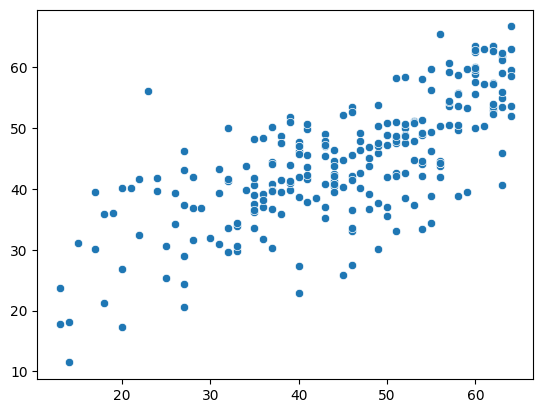

In [252]:
y_pred = model.predict(x2)
sns.scatterplot(y = y_scaler.inverse_transform(y_pred.reshape(-1,1))[:,0],
                x = y_scaler.inverse_transform(y)[:,0])


In [157]:
linear_preds = [x[1] for x in sorted_cols if x[0] > 0.05]
linear_preds2 = [x[1] for x in sorted_cols if x[0] > 0.1]

In [294]:
[x for x in df_orig if 'Seeking' in df_orig[x].values]

C:\Users\Sean\AppData\Local\Temp\ipykernel_14432\334785375.py:1: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  [x for x in df_orig if 'Seeking' in df_orig[x].values]


['Education benefits (e.g., Montgomery, Post-9/11, GI Bill) - for my family  or myself:What information or resources are you seeking (Select all that apply)?',
 'Legal assistance:What information or resources are you seeking (Select all that apply)?',
 'Obtaining employment:What information or resources are you seeking (Select all that apply)?',
 'Better employment conditions (with better pay, benefits, etc.):What information or resources are you seeking (Select all that apply)?',
 'New housing:What information or resources are you seeking (Select all that apply)?',
 'Better housing conditions (safer, more secure):What information or resources are you seeking (Select all that apply)?',
 'Better transportation:What information or resources are you seeking (Select all that apply)?',
 'Opportunities for me to connect with other military/veteran service members and families/caregivers:What information or resources are you seeking (Select all that apply)?',
 'Opportunities for recreational 

In [301]:
[x for x in df_orig if x.lower().startswith('are')]

['Are you, or were you ever, an active member of the military or member of the National Guard or Reserve?',
 'Are you currently pursuing any of the following degrees or certifications?',
 'Are you at risk of becoming homeless?',
 'Are highly responsive:To what extent do you disagree or agree with the following statements regardingÂ\xa0veteran serving organizations within your community?']

In [306]:
dir(fuzz)

['QRatio',
 'SequenceMatcher',
 'UQRatio',
 'UWRatio',
 'WRatio',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__spec__',
 '_process_and_sort',
 '_token_set',
 '_token_sort',
 'partial_ratio',
 'partial_token_set_ratio',
 'partial_token_sort_ratio',
 'platform',
 'ratio',
 'token_set_ratio',
 'token_sort_ratio',
 'unicode_literals',
 'utils',
 'warnings']

In [326]:
do_cols = [x.split(':')[0] for x in df_orig if any(x.lower().startswith(y) 
                                                   for y in ['do ', 'have ', 'are ']) and (
                        'yes' in ''.join([str(k).lower() for k in df_orig[x].unique()]))
          ]
seek_cols = [x.split(':')[0] for x in df_orig if 'seek' in (''.join([str(k).lower() for k in df_orig[x].unique()]))]

matches = matchColumns(seek_cols, do_cols)

---- Column 1 Education benefits (e.g., Montgomery, Post-9/11, GI Bill) - for my family  or myself
---- Column 2 Have you ever used education benefits from the VA to pursue a degree or certification? (e.g., Montgomery, Post-9/11, GI Bill)

y
---- Column 1 Legal assistance
---- Column 2 Have you ever received information or assistance fromÂ veteran serving organizations within your community?

n
---- Column 1 Legal assistance
---- Column 2 Do you have a VA disability claim pending?Â 

n
---- Column 1 Legal assistance
---- Column 2 Do you regularly exercise (engage in physical activity)?

n
---- Column 1 Legal assistance
---- Column 2 Do you participate in any spiritual/religious activities?Â  Â 

n
---- Column 1 Legal assistance
---- Column 2 Do you haveÂ a personal budget?

n
---- Column 1 Obtaining employment
---- Column 2 Do you have any emergency savings?

n
---- Column 1 Obtaining employment
---- Column 2 Do you have a VA disability claim pending?Â 



KeyboardInterrupt: Interrupted by user

In [80]:
sorted_features = [y for y in sorted(enumerate(model.best_estimator_.feature_importances_), key = lambda x: x[1])]
accum = 0
prev_accum = 0
thsh = .999
accum_features = []
accum_plot = []
accum_plt2 = []

for i, x in enumerate(sorted_features[::-1]):
    if accum >= thsh:
        break
    accum += x[1]
    accum_plot.append(1- accum)
    accum_plt2.append(accum - prev_accum)
    accum_features.append(x[0])
    prev_accum = accum

In [81]:
sorted_features[-5:]

[(21, 0.05563287801022995),
 (4, 0.056727655409553296),
 (8, 0.07184894680905095),
 (6, 0.09416046884610968),
 (3, 0.30864179462518027)]

In [82]:
sns.barplot?

In [84]:
seen = set()
vals = []
cols = []
cnt = 1
for val, col in sorted(zip(sum([pca.components_[i]*[z for j,z in sorted_features[-5:] if j == i][0] for i in [1,0,3,4]]), XX.columns), key = lambda x: abs(x[0]))[::-1]:
    if col[::-1].split('_',1)[-1] in seen:
        continue
    
    seen.add(col[::-1].split('_',1)[-1])
    vals.append(val)
    col = col.split(':')[0]
    cols.append(col)
    if val < .04:
        continue
    print(str(cnt) + '.  ' + resize(col))
    #print(round(val,2))
    #print(len(seen))
    cnt+=1

IndexError: list index out of range

In [218]:
'?'

'?'

<AxesSubplot: xlabel='Have you participated in adaptive sports programs?Â\xa0', ylabel='Hope Scale Score'>

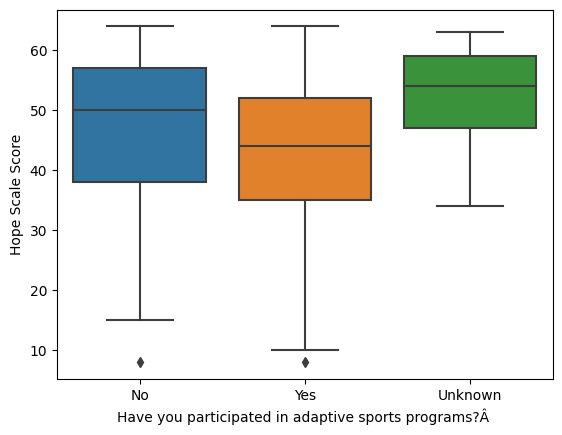

In [190]:
sports_question = [x for x in df_orig if 'adaptive' in x.lower()][1]
sns.boxplot(data = df_orig[[sports_question] + ['Hope Scale Score']],
            x = sports_question,
            y = 'Hope Scale Score')

In [225]:
df = df_orig_military.copy()
df_onehot = pd.get_dummies(df[[x for x in df if types[x] == 'qualitative']])
df = pd.concat([df, df_onehot], axis = 1)
df = df.drop(columns = r_types['nan/drop'] + r_types['qualitative'])
df[r_types['quantitative']] = encode(df[r_types['quantitative']], conversion_dictionary)

for col in r_types['quantitative']:
    un = df[col].unique()
    if len(un) == 2:
        print(col)
        df[col] = df[col].isna()
    if len(un) == 1:
        df = df.drop(columns = col)
df['description'] = ''
for col in r_types['description']:
    df['description'] = df['description'] + ' ' + df[col].fillna(' ')
df = df.drop(columns = r_types['description'])

NameError: name 'types' is not defined

In [11]:
dfPredict = df.copy()
dropCols = []
for col in dfPredict:
    dfPredict[col] = dfPredict[col].fillna(dfPredict[col].mode())
    try: 
        dfPredict[col] = dfPredict[col].fillna(dfPredict[col].mean())
        dfPredict[col] = dfPredict[col].astype(float)
    except: 
        dropCols.append(col)
dfPredict = dfPredict.drop(columns = dropCols)

NameError: name 'df' is not defined

In [22]:
predictable = []
for col in df:
    if df[col].isna().sum() == 0 or col in dropCols:
        continue
    predictionColumn = col
    nonPredict = [x for x in dfPredict if x != col]
    dfPredict_na = dfPredict[df[predictionColumn].isna()]
    dfPredict_notna = dfPredict[~df[predictionColumn].isna()]
    model = ExtraTreesRegressor(n_estimators = 200)
    #model = LinearRegression()
    y_scaler = StandardScaler()
    x_scaler = StandardScaler()
    XX = dfPredict_notna[[x for x in dfPredict_notna.columns if not x == predictionColumn]]
    YY = df.loc[~df[predictionColumn].isna(), predictionColumn]
    X, x, Y, y = train_test_split(XX, YY)
    pca = PCA(n_components = min(len(X), len(X.columns)))
    X2 = x_scaler.fit_transform(X)
    x2 = x_scaler.transform(x)
    X3 = pca.fit_transform(X2)
    x3 = pca.transform(x2)
    Y = y_scaler.fit_transform(Y.values.reshape(-1,1))
    y = y_scaler.transform(y.values.reshape(-1,1))
    model.fit(X3, Y)
    s = model.score(x3, y)
    if s > .5:
        predictable.append(col)
        print(col)
        print(s)
        print()
        dfPredict.loc[df[predictionColumn].isna(), predictionColumn] = y_scaler.inverse_transform(model.predict(
            dfPredict_na[nonPredict].values
        ).reshape(-1,1)).reshape(-1,)
        continue
    model.fit(X2, Y)
    s = model.score(x2, y)
    if s > .5:
        predictable.append(col)
        print(col)
        print(s)
        print()
        dfPredict.loc[df[predictionColumn].isna(), predictionColumn] = y_scaler.inverse_transform(model.predict(
            dfPredict_na[nonPredict].values
        ).reshape(-1,1)).reshape(-1,)
        continue
    model.fit(X, Y)
    s = model.score(x, y)
    if s > .5:
        predictable.append(col)
        print(col)
        print(s)
        print()
        dfPredict.loc[df[predictionColumn].isna(), predictionColumn] = y_scaler.inverse_transform(model.predict(
            dfPredict_na[nonPredict].values
        ).reshape(-1,1)).reshape(-1,)

C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)


Have you ever received information or assistance from  <Community Integration Organization>?
0.8995269648829427



C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)


What year did you begin your time in the service? (Ex: 1985)
0.7236754251185209



C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)


What year did your status become retired/discharged? (Ex: 2006)
0.6719543180650047



C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:45: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykerne

Do you have health insurance coverage?
1.0



C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:45: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykerne

Do you have a VA disability claim pending?  
0.6794850373134331



C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:45: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykerne

Is highly responsive:To what extent do you agree or disagree with the following statements regarding  <Community Integration Organization>?
0.5777641606822264



C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2, Y)


Cares deeply about my well being:To what extent do you agree or disagree with the following statements regarding  <Community Integration Organization>?
0.600045062854826



C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:45: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykerne

Has helped me feel more connected to my community:To what extent do you agree or disagree with the following statements regarding  <Community Integration Organization>?
0.5304606598128503



C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:45: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykerne

Has helped me find a better job that can support me/my family :To what extent do you agree or disagree with the following statements regarding  <Community Integration Organization>?
0.5631120758577126



C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2, Y)


Has helped me stay in my current job:To what extent do you agree or disagree with the following statements regarding  <Community Integration Organization>?
0.5456496479733479



C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2, Y)


Has helped me become healthier overall:To what extent do you agree or disagree with the following statements regarding  <Community Integration Organization>?
0.5557377199261049



C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2, Y)


Has helped me improve my level of physical fitness:To what extent do you agree or disagree with the following statements regarding  <Community Integration Organization>?
0.7286421758519701



C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)


Has helped me improve my eating habits:To what extent do you agree or disagree with the following statements regarding  <Community Integration Organization>?
0.5354017240306396



C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2, Y)


Has reduced my level of daily stress:To what extent do you agree or disagree with the following statements regarding  <Community Integration Organization>?
0.5445877169524828



C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)


Has helped me feel more fulfilled in my daily life:To what extent do you agree or disagree with the following statements regarding  <Community Integration Organization>?
0.5022378310993277



C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2, Y)


Has empowered me:To what extent do you agree or disagree with the following statements regarding  <Community Integration Organization>?
0.5532734450461413



C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:45: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykerne

Do staff members at <Community Integration Organization> still communicate with you to include in-person meetings, newsletters, emails, phone calls, or social media campaigns?  
0.9998211860902255



C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:45: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykerne

Overall, how satisfied are you with  <Community Integration Organization>'s ability to provide information and resources? Please use the scale below to indicate your level of satisfaction.
0.5910468154235748



C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2, Y)


How likely is it that you would recommend <Community Integration Organization>  to a veteran or friend? Please use the scale below to indicate your likelihood to recommend <Community Integration Organization>.   
0.598062917192856



C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:45: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykerne

Are you actively seeking employment?
0.9906256740721207



C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:45: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykerne

Approximately how much was your household annual income for the previous year?  
0.6128750519264718



C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2, Y)


Individual  annual income:
0.7007066828286644



C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2, Y)


Did <Community Integration Organization>  or an organization they referred you to, help you enroll in school/an educational program that you are attending or have attended?  
0.6862450020316946



C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:45: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykerne

Do you have  a budget?
1.0



C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:45: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykerne

Do you have any emergency savings?
0.9960324419525616



C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:45: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykerne

Do you know your credit score?
0.9915773778129393



C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:45: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)


Do you currently have any untreated medical conditions? Note: Medical conditions may include any short or long-term physical or mental issues (e.g., neck pain, traumatic brain injury (TBI), post-traumatic stress disorder (PTSD), sleep problems, diabetes, heart conditions etc.)
0.5258552213591008



C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2, Y)


Do you currently have any medical conditions that are being or have been treated?  
0.9449187597090805



C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2, Y)


Has <Community Integration Organization> or their Partners provided assistance  in submitting or updating a healthcare/benefits claim?
1.0



C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:45: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykerne

Do you have any injuries or disabilities that prevent you from engaging in moderate physical activity? Moderate exercise includes: brisk walks, jogs, cycling, team sports etc. 
0.9916258506867524



C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:45: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykerne

Feet:About how tall are you without shoes? Please estimate to the best of your ability.
0.5563285634244732



C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X2, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:45: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X, Y)
C:\Users\Sean\AppData\Local\Temp\ipykernel_14976\903391092.py:23: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X3, Y)
C:\Users\Sean\AppData\Local\Temp\ipykerne

height_inches
0.8802914632294924



In [62]:
school_labels = ['educa', 'school', 'college', 'student', 'study']
job_labels = ['job', 'work', 'career', 'employ', 'salary', 'trade']
finance_labels = ['credit', 'financ', 'pay', 'salary', 'income', 'money']
labels_dict = {}
for labelName, labels in zip(['Education', 'Employment', 'Financial'], [school_labels, job_labels, finance_labels]):
    labels_dict[labelName] = [col for col in dfPredict if any(x in col.lower() for x in labels)]

In [ ]:
s = []
s2 = []
for i in range(20):
    model = ExtraTreesRegressor(n_estimators = 50)
    y_scaler = StandardScaler()
    XX = dfHeight_notna[[x for x in dfHeight_notna.columns if not x == predictionColumn]]
    YY = dfHeight_notna[predictionColumn]
    X, x, Y, y = train_test_split(XX, YY)
    y_scaler = StandardScaler()
    x_scaler = StandardScaler()
    X = x_scaler.fit_transform(X)
    x = x_scaler.transform(x)
    Y = y_scaler.fit_transform(Y.values.reshape(-1,1))
    y = y_scaler.fit_transform(y.values.reshape(-1,1))
    model.fit(X, Y)
    s.append(model.score(x, y))
    print(s)
    print(sum(s)/len(s))

In [118]:
df[[x for x in df if not 'Response' in x and df[x].nunique()>10]]

,Time Started,Date Submitted,Referer,SessionID,What year did you begin your time in the service? (Ex: 1985),What year did your status become retired/discharged? (Ex: 2006),Hope Scale Score,Where are you currently enrolled?,What is your degree/certification field of study?,Other -Please describe:What type of health insurance coverage do you currently have for yourself? Please check all that apply..1,What is your zip code?,Which organization referred you?,In another public or private location - please describe:Where did <Community Integration Organization> first engage you?,At what educational institute did they engage you?,Where are you currently employed?,Other::Please check all that apply to indicate which type of medical conditions you are not currently receiving treatment for:.1,Other - Write In:You have indicated that you have a form of healthcare coverage as well as you have untreated medical conditions. What prevents you from receiving treatment for your medical conditions?,Other::Please check all that apply to indicate which type of medical conditions you are currently receiving treatment for:.1,Which organization helped you file a healthcare/benefits claim?,What is your current weight? (in pounds)
0,2018-01-02 18:21:39,2018-01-02 18:29:22,http://www.surveygizmo.com/s3/4089322/Annual-S...,1514935279_5a4c13ef52ddd5.25278054,2008.0,NaN,56,NaN,NaN,NaN,30305,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2018-01-02 19:09:31,2018-01-02 19:21:16,https://www.facebook.com/,1514938133_5a4c1f152aa144.81812148,1972.0,1998.0,52,NaN,NaN,NaN,30127,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230.0
2,2018-01-02 19:14:55,2018-01-02 19:24:21,http://m.facebook.com,1514938451_5a4c205342b922.24795637,1970.0,1976.0,54,NaN,NaN,NaN,30269,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,210.0
3,2018-01-02 19:16:24,2018-01-02 19:24:58,http://www.surveygizmo.com/s3/4089322/Annual-S...,1514938235_5a4c1f7b7d8617.95404360,1984.0,2004.0,47,NaN,NaN,NaN,30118,NaN,NaN,NaN,at a state university,NaN,NaN,NaN,NaN,200.0
4,2018-01-03 10:13:35,2018-01-03 10:16:49,http://www.surveygizmo.com/s3/4089322/Annual-S...,1514992405_5a4cf315ba4631.14527175,2002.0,NaN,64,NaN,NaN,NaN,30017,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1618,2018-02-03 16:11:08,2018-02-03 16:25:22,http://www.surveygizmo.com/s3/4090794/Annual-S...,1517692263_5a762567efce30.55866467,1977.0,1985.0,40,not enrolled yet,Education,NaN,92704,NaN,NaN,NaN,NaN,NaN,I 'm not sure where to go.,NaN,NaN,110.0
1619,2018-02-03 18:49:33,2018-02-03 19:18:53,android-app://com.google.android.gm,1517701746_5a764a725a3ac7.47883685,1992.0,1997.0,58,NaN,NaN,NaN,92870,EDD,NaN,NaN,Rowland Unified School district,NaN,NaN,NaN,NaN,209.0
1620,2018-02-03 18:50:19,2018-02-03 19:24:35,http://www.surveygizmo.com/s3/4090794/Annual-S...,1517701638_5a764a06638626.96148564,1986.0,2004.0,48,NaN,NaN,NaN,92801,South county veterans out reach,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1621,2018-02-04 18:27:23,2018-02-04 18:43:48,http://www.surveygizmo.com/s3/4090794/Annual-S...,1517786817_5a7796c125db80.92052733,1988.0,1990.0,44,NaN,NaN,NaN,92602,NaN,NaN,NaN,"SmartSource, Inc",NaN,NaN,NaN,NaN,230.0


<AxesSubplot: >

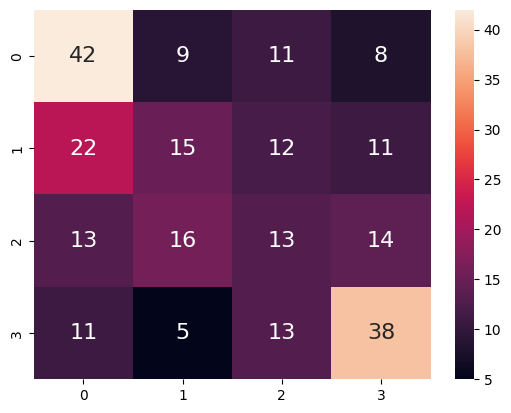

In [331]:
num_quantiles = 4
quantiles = [df['Hope Scale Score'].quantile((1/num_quantiles)*(i+1)) for i in range(num_quantiles)]
YY = df['Hope Scale Score'].apply(lambda x: sum([x > quantiles[i] for i in range(num_quantiles)]))
XX = df[[x for x in df if 'seek' in x]]
X, x, Y, y = train_test_split(XX, YY, random_state = 42)
model = LogisticRegression()
model.fit(X,Y)
model.score(x, y)
y_pred = model.predict(x)
sns.heatmap(confusion_matrix(y, y_pred), annot=True, annot_kws={"size": 16})

<AxesSubplot: >

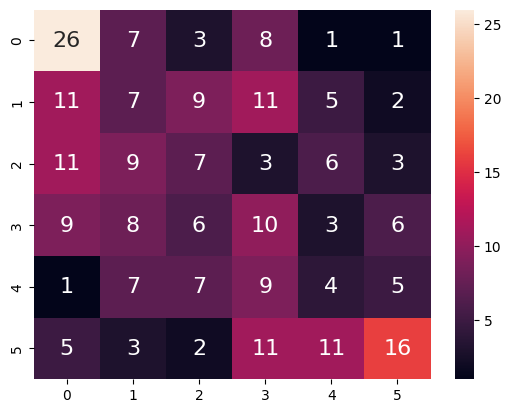

In [334]:
cols = []
scores = []
num_quantiles = 10
quantiles = [df['Hope Scale Score'].quantile((1/num_quantiles)*(i+1)) for i in range(num_quantiles)]
YY = df['Hope Scale Score'].apply(lambda x: sum([x > quantiles[i] for i in range(num_quantiles)]))
for col in df:
    if 'Hope Scale' in col:
        continue
    XX = df[[col]]
    X, x, Y, y = train_test_split(XX, YY, random_state = 42)
    model = LogisticRegression()
    model.fit(X, Y)
    cols.append(col)
    scores.append(model.score(x,y))

K:\Anaconda\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [267]:
m_score = sum(scores)/len(scores)

<AxesSubplot: ylabel='Count'>

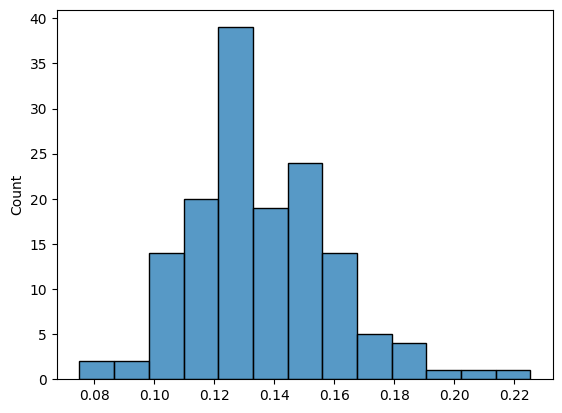

In [335]:
sns.histplot(scores)

In [336]:
logistic_predictors = [cols[i] for i, x in enumerate(scores) if x > 0.16]

In [338]:
for n in range(100):
    

253

In [41]:
df = encode(df,conversion_dictionary)
df2 = df.copy()

In [284]:
np.random.shuffle

<function RandomState.shuffle>

In [414]:
scores = []
scores2 = []
cols = []
for col in df:
    for col2 in df:
        if 'hope' in col.lower():
            continue
        XX = df[[col, col2]]
        #XX = df[accum_features]
        YY = df[[pred_col]]
        X, x, Y, y = train_test_split(XX, YY, random_state = random_state)
        y_scaler = StandardScaler()
        x_scaler = StandardScaler()
        Y = y_scaler.fit_transform(Y)
        y = y_scaler.transform(y)
        X2 = x_scaler.fit_transform(X)
        x2 = x_scaler.transform(x)
        model = LinearRegression()
        model.fit(X2, Y)
        pred = model.predict(x2)[:, 0]
        y = y[:, 0]
        score = sum((pred - y)**2)
        tmpscores = []
        for i in range(100):
            np.random.shuffle(y)
            tmpscores.append(sum((pred - y)**2))
        mean_rnd_score = np.median(tmpscores)
        std_rnd_score = np.std(tmpscores)
        if score > (mean_rnd_score + 2*std_rnd_score):
            scores.append(score)
            cols.append(col)
            print('--- LINEAR ---')
            print(score)
            print(col, col2)
    
linear_cols = [x[0] for x in sorted(zip(cols, scores, scores2), key = lambda x: x[1]) if x[1] >= x[2] and x[1] > 0.05]
sq_cols = [x[0] for x in sorted(zip(cols, scores, scores2), key = lambda x: x[2]) if x[2] > x[1] and x[2] > 0.05]

KeyboardInterrupt: 

<AxesSubplot: xlabel='Length Of Service In Decades', ylabel='Hope Scale Score'>

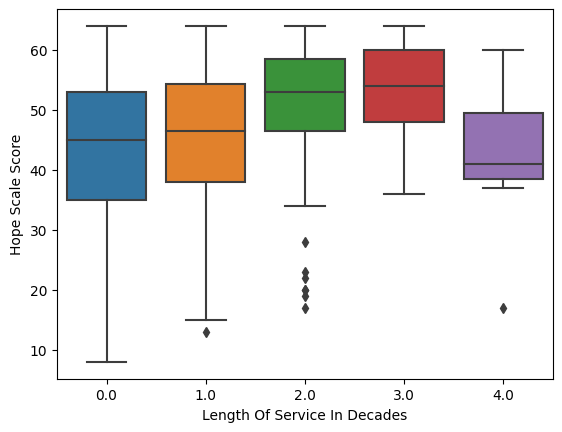

In [345]:

sns.boxplot(data = df, x = 'Length Of Service In Decades', y = 'Hope Scale Score')

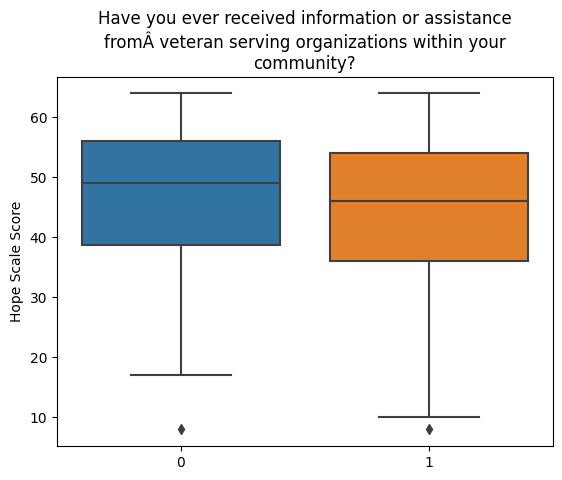

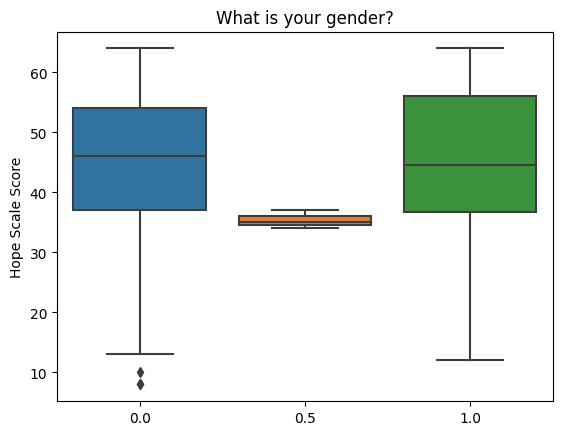

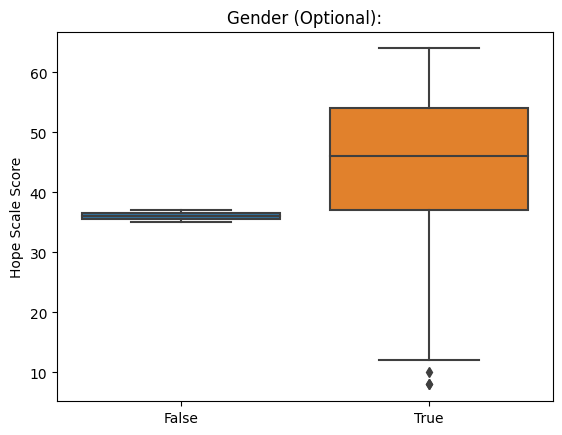

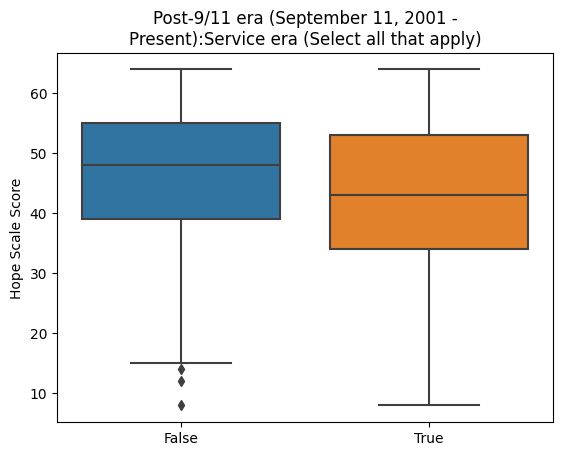

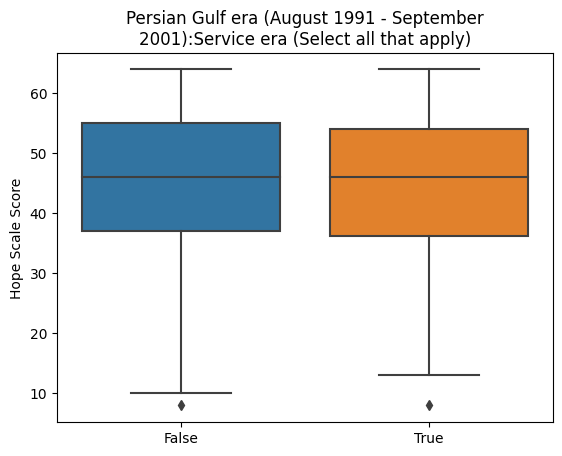

...

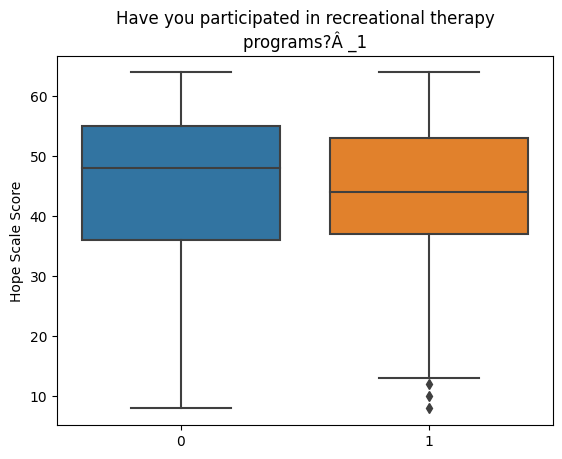

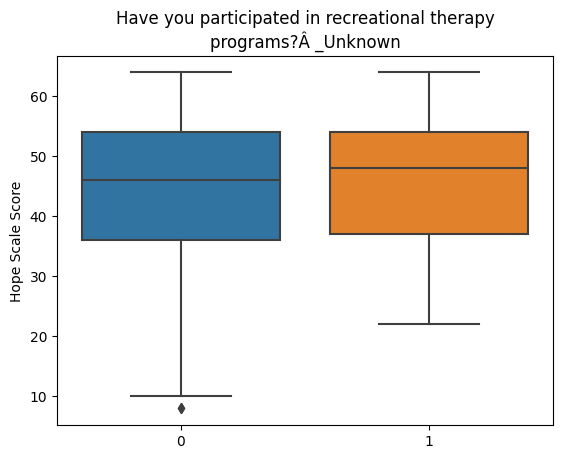

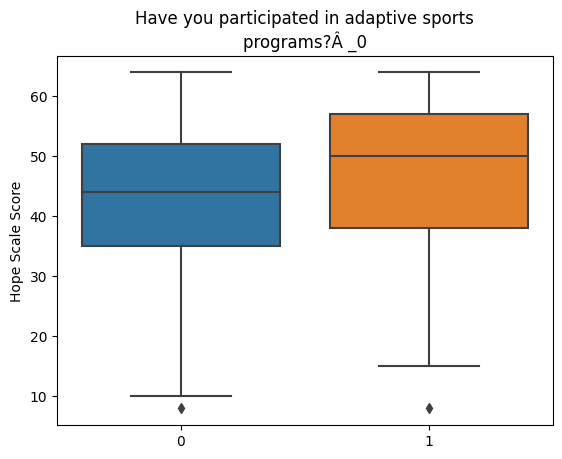

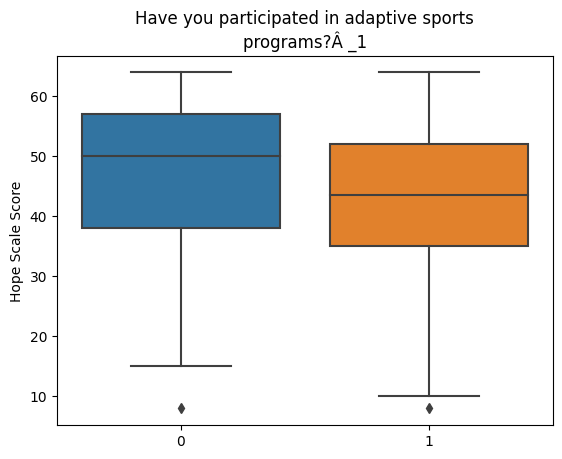

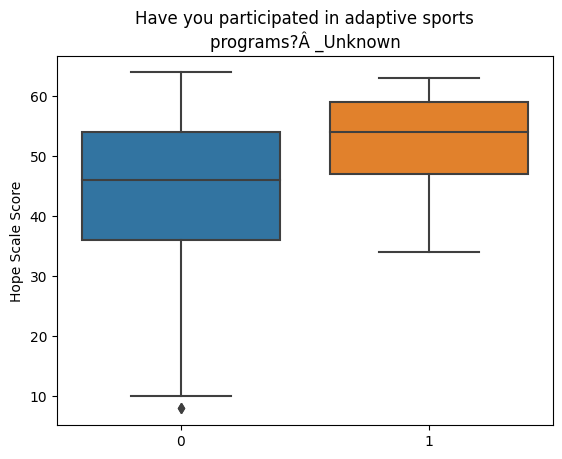

In [350]:
for col in df:
    if 'hope' in col.lower():
        continue
    uns = df[col].nunique()
    if uns == 1 or uns > 10:
        continue
    ax = sns.boxplot(data = df, x = col, y = 'Hope Scale Score')
    ax.set(xlabel = '', title = resize(col))
    plt.show()

In [372]:
inertias = []
points = []
for x in range(1, 21):
    clusters = x*3
    km = KMeans(n_clusters = clusters)
    km.fit(X2)
    inertias.append(km.inertia_)
    points.append(clusters)

K:\Anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
K:\Anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
K:\Anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
K:\Anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
K:\Anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` w

In [373]:
inertial_growth = [(inertias[i] - inertias[i+1])/inertias[i] for i in range(len(inertias)-1)]

<AxesSubplot: >

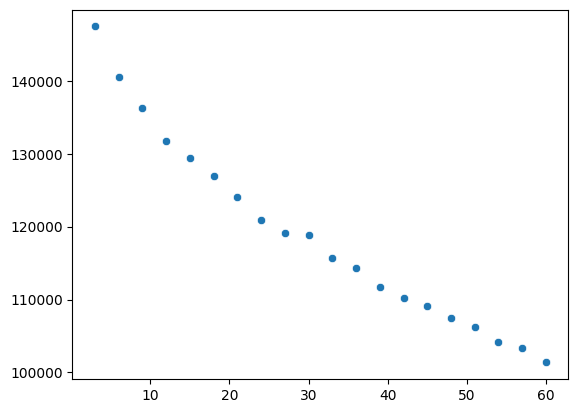

In [374]:
sns.scatterplot(x = points, y = inertias)

In [364]:
X

,"Are you, or were you ever, an active member of the military or member of the National Guard or Reserve?",Have you ever received information or assistance fromÂ veteran serving organizations within your community?,What is your gender?,Gender (Optional):,"Post-9/11 era (September 11, 2001 - Present):Service era (Select all that apply)",Persian Gulf era (August 1991 - September 2001):Service era (Select all that apply),Post-Vietnam era (May 1975 - July 1991):Service era (Select all that apply),Vietnam era (August 1964 - April 1975):Service era (Select all that apply),Between Korea and Vietnam era (February 1955 - July 1964):Service era (Select all that apply),Korean War era (June 1950 - January 1955):Service era (Select all that apply),...,You have indicated that you have a form of healthcare coverage as well as you have untreated medical conditions. What prevents you from receiving treatment for your medical conditions? Â _Work/personal schedule doesn't allow for time off,Were you ever deployed to a combat zone?Â _0,Were you ever deployed to a combat zone?Â _1,Were you ever deployed to a combat zone?Â _Unsure,Have you participated in recreational therapy programs?Â _0,Have you participated in recreational therapy programs?Â _1,Have you participated in recreational therapy programs?Â _Unknown,Have you participated in adaptive sports programs?Â _0,Have you participated in adaptive sports programs?Â _1,Have you participated in adaptive sports programs?Â _Unknown
685,1,1,0.0,True,False,False,False,True,True,True,...,0,0,1,0,0,1,0,1,0,0
1832,1,1,0.0,True,False,False,True,True,True,True,...,1,0,1,0,0,1,0,0,1,0
1101,1,1,0.0,True,True,False,True,True,True,True,...,1,0,1,0,1,0,0,1,0,0
2366,1,1,1.0,True,False,False,False,True,True,True,...,1,1,0,0,0,1,0,0,1,0
1417,1,1,0.0,True,False,False,True,True,True,True,...,1,0,1,0,1,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
347,1,1,0.0,True,False,False,False,True,True,True,...,1,1,0,0,1,0,0,1,0,0
709,1,1,0.0,True,False,True,True,True,True,True,...,1,0,1,0,1,0,0,1,0,0
2438,1,1,0.0,True,True,False,False,False,True,True,...,1,0,0,1,1,0,0,1,0,0
1192,1,1,0.0,True,False,True,True,True,True,True,...,1,0,1,0,0,1,0,0,1,0


In [367]:
x_scaler.transform(X)

array([[ 0.        ,  0.35355339, -0.48403435, ...,  1.14231259,
        -1.10318122, -0.13227485],
       [ 0.        ,  0.35355339, -0.48403435, ..., -0.87541712,
         0.90646939, -0.13227485],
       [ 0.        ,  0.35355339, -0.48403435, ...,  1.14231259,
        -1.10318122, -0.13227485],
       ...,
       [ 0.        ,  0.35355339, -0.48403435, ...,  1.14231259,
        -1.10318122, -0.13227485],
       [ 0.        ,  0.35355339, -0.48403435, ..., -0.87541712,
         0.90646939, -0.13227485],
       [ 0.        ,  0.35355339, -0.48403435, ...,  1.14231259,
        -1.10318122, -0.13227485]])

In [421]:
for x in range(1,10):
    nnmodel = KNeighborsRegressor(n_neighbors=x*3, weights = 'distance', p = 1)
    nnmodel.fit(X2, Y)
    print(nnmodel.score(x2, y))

0.46837355998820707
0.5005290827362867
0.5074837140254809
0.49653017974832725
0.4985163657485576
0.4697902098048182
0.45182004738492454
0.4427339171071346
0.4365815469066002


KNeighborsRegressor(n_neighbors=20)

0.48311847325239654

In [383]:
dir(nnmodel)

['__abstractmethods__',
 '__annotations__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_abc_impl',
 '_check_algorithm_metric',
 '_check_feature_names',
 '_check_n_features',
 '_fit',
 '_fit_X',
 '_fit_method',
 '_get_param_names',
 '_get_tags',
 '_kneighbors_reduce_func',
 '_more_tags',
 '_parameter_constraints',
 '_radius_neighbors_reduce_func',
 '_repr_html_',
 '_repr_html_inner',
 '_repr_mimebundle_',
 '_tree',
 '_validate_data',
 '_validate_params',
 'algorithm',
 'effective_metric_',
 'effective_metric_params_',
 'fit',
 'get_params',
 'kneighbors',
 'kneighbors_graph',
 'leaf_size',
 'metric',
 'metric_params',
 'n_features

In [35]:
df_orig_military

,Response ID,Time Started,Date Submitted,Status,Legacy Comments,Comments,Language,Referer,SessionID,User Agent,...,Inches:,What is your current weight? (in pounds)Â,Do you participate in any spiritual/religious activities?Â Â,What do you practice? (Optional) Â,How often do you participate in spiritual or religious practices? Â,"By clicking here, you are agreeing that the information you provided in this survey is valid and true to your identity. Also you are agreeing that this information has only been completed once.:Attestation",Optional: Please feel free to share any additional information about the services and support you have received within your community.,Optional: Please feel free to share any additional information about the services and support you have received within your community. - Text Analysis:Optional: Please feel free to share any additional information about the services and support you have received within your community.,Gift Registration- Military Connected,Contact Information- Non Military Connected
0,27,2022-06-21 16:09:56,2022-06-21 16:29:12,Complete,NaN,NaN,English,https://survey.alchemer.com/s3/6792994/AKWP2022,1655842182_62b225867913e6.56198596,NaN,...,8.0,170.0,Yes,Christian meditation,Monthly,"By clicking here, you are agreeing that the information you provided in this survey is valid and...",NaN,NaN,NaN,NaN
1,28,2022-06-21 18:40:24,2022-06-21 18:45:50,Complete,NaN,NaN,English,https://t.co/,1655851190_62b248b66e0465.25156067,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,29,2022-06-21 19:26:27,2022-06-21 19:44:36,Complete,NaN,NaN,English,https://survey.alchemer.com/s3/6792994/AKWP2022,1655853977_62b25399bbbf67.34346194,NaN,...,4.0,240.0,No,NaN,NaN,"By clicking here, you are agreeing that the information you provided in this survey is valid and...",NaN,NaN,NaN,NaN
3,30,2022-06-21 19:50:40,2022-06-21 20:48:26,Complete,NaN,NaN,English,http://m.facebook.com/,1655855428_62b25944e4a5a5.96298484,NaN,...,11.0,280.0,No,NaN,NaN,"By clicking here, you are agreeing that the information you provided in this survey is valid and...",NaN,NaN,NaN,NaN
4,31,2022-06-21 19:58:03,2022-06-21 20:18:25,Complete,NaN,NaN,English,https://www.facebook.com/,1655855872_62b25b00793b67.73959091,NaN,...,6.0,190.0,No,NaN,NaN,"By clicking here, you are agreeing that the information you provided in this survey is valid and...",NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2901,2929,2022-08-26 16:50:22,2022-08-26 17:04:46,Complete,NaN,NaN,English,https://survey.alchemer.com/s3/6792994/PanhandleWP2022,1661547017_63093209bde282.67256705,NaN,...,8.0,195.0,No,NaN,NaN,"By clicking here, you are agreeing that the information you provided in this survey is valid and...",NaN,NaN,NaN,NaN
2902,2930,2022-08-26 17:06:46,2022-08-26 17:20:12,Complete,NaN,NaN,English,https://www.linkedin.com/,1661547987_630935d3b9c359.28929043,NaN,...,2.0,200.0,No,NaN,NaN,"By clicking here, you are agreeing that the information you provided in this survey is valid and...",NaN,NaN,NaN,NaN
2903,2931,2022-08-26 21:05:37,2022-08-26 21:13:03,Complete,NaN,NaN,English,https://survey.alchemer.com/s3/6792994/PanhandleWP2022?fbclid=IwAR2KaeNvxRPiFBiwwa9ktYVaWbMyWUQb...,1661562292_63096db4c7f0b4.10762975,NaN,...,3.0,54.0,Yes,NaN,Weekly,"By clicking here, you are agreeing that the information you provided in this survey is valid and...",no,NaN,NaN,NaN
2904,2932,2022-08-26 21:55:21,2022-08-26 22:11:47,Complete,NaN,NaN,English,https://www.linkedin.com/,1661565265_63097951bf1ad2.22661751,NaN,...,8.0,145.0,Yes,Christianity,Monthly,"By clicking here, you are agreeing that the information you provided in this survey is valid and...",NaN,NaN,NaN,NaN


In [73]:
inertias = []
for x in range(20):
    km_seek = KMeans(n_clusters = (x+1) * 3)
    km_seek.fit(df_orig_military[[x for x in df_orig_military if 'Seek' in 
                                   '@'.join([str(y) for y in df_orig_military[x].unique()])]].fillna(
        "Not Seeking").replace({
        "Seeking" : True,
    "Not Seeking" : False}))
    inertias.append(km_seek.inertia_)

K:\Anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
K:\Anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
K:\Anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
K:\Anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
K:\Anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` w

<AxesSubplot: >

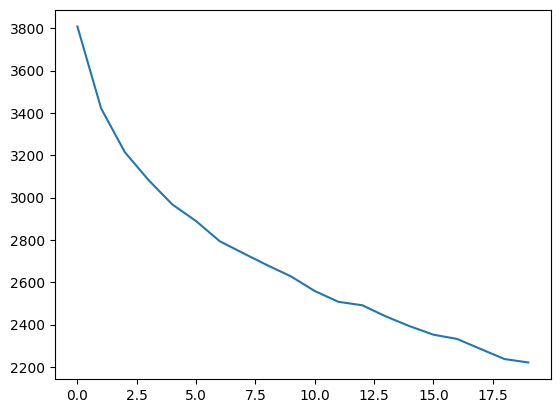

In [74]:
sns.lineplot(x = range(20), y = inertias)

In [77]:
pca_seek = PCA()
mm = pca_seek.fit_transform(df_orig_military[[x for x in df_orig_military if 'Seek' in 
                                   '@'.join([str(y) for y in df_orig_military[x].unique()])]].fillna(
        "Not Seeking").replace({
        "Seeking" : True,
    "Not Seeking" : False}))

<AxesSubplot: >

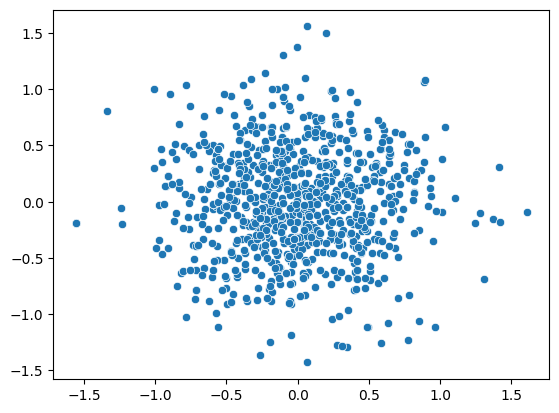

In [88]:
sns.scatterplot(x = mm[:,7], y = mm[:,6])

In [89]:
inertias = []
for x in range(20):
    km_seek = KMeans(n_clusters = (x+1) * 3)
    km_seek.fit(mm)
    inertias.append(km_seek.inertia_)

K:\Anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
K:\Anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
K:\Anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
K:\Anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
K:\Anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` w

<AxesSubplot: >

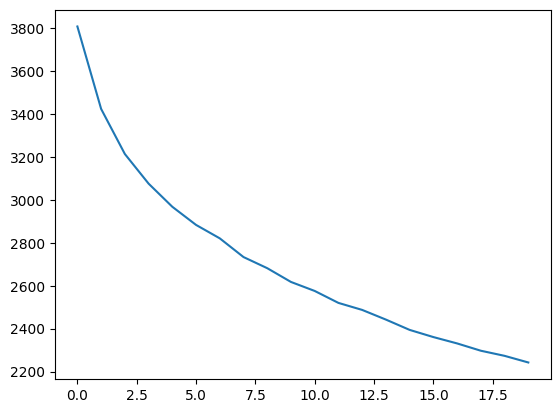

In [90]:
sns.lineplot(x = range(20), y = inertias)

In [426]:
catagory_columns = [x for x in df if df[x].nunique() <= 10 and not 'Hope' in x]
non_catagory_columns = [x for x in df if not x in catagory_columns and not 'Hope' in x]
ANOVA = SelectKBest(f_classif, k = 'all')
RANK = SelectKBest(SpRankTest, k = 'all')
ANOVA.fit_transform(df[catagory_columns], df['Hope Scale Score'])
ANOVA.get_feature_names_out()

In [427]:
f_classif(df[[x for x in df if 'seek' in x]].apply(sum, axis = 1).values.reshape(-1,1), df['Hope Scale Score'])

(array([2.3818618]), array([2.05012576e-07]))

In [428]:
ANOVA.fit_transform(df[catagory_columns], df['Hope Scale Score'])
ANOVA.get_feature_names_out()

K:\Anaconda\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:112: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
K:\Anaconda\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:113: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


array(['Are you, or were you ever, an active member of the military or member of the National Guard or Reserve?',
       'Have you ever received information or assistance fromÂ\xa0veteran serving organizations within your community?',
       'What is your gender?',
       'Post-9/11 era (September 11, 2001 - Present):Service era (Select all that apply)',
       'Persian Gulf era (August 1991 - September 2001):Service era (Select all that apply)',
       'Post-Vietnam era (May 1975 - July 1991):Service era (Select all that apply)',
       'Vietnam era (August 1964 - April 1975):Service era (Select all that apply)',
       'US Army:Branch of service (Select all that apply)',
       'US Marines:Branch of service (Select all that apply)',
       'US Navy:Branch of service (Select all that apply)',
       'US Air Force:Branch of service (Select all that apply)',
       'Service status (Most recent or current status)Â\xa0',
       'Education benefits (e.g., Montgomery, Post-9/11, GI Bill) - 

In [396]:
RANK.fit_transform(df[non_catagory_columns], df['Hope Scale Score'])

ValueError: too many values to unpack (expected 2)

In [430]:
for col in non_catagory_columns:
    print(col)
    print(SpRank(df[col], df['Hope Scale Score']))

What year did you begin your time in the service? (Ex: 1985)
-0.09947398838072341
height_inches
0.0660430107462989
YearsOfService
0.10080293684926415
Seeking Value
-0.2706933912244435


In [431]:
{x for x in zip(ANOVA.scores_, catagory_columns) if x[1] in [y for y in df if 'seek' in y.lower()]}

[(2.055662787435842,
  'Education benefits (e.g., Montgomery, Post-9/11, GI Bill) - for my family  or myself:What information or resources are you seeking (Select all that apply)?'),
 (1.2091967605493155,
  'Legal assistance:What information or resources are you seeking (Select all that apply)?'),
 (2.2784722457530777,
  'Obtaining employment:What information or resources are you seeking (Select all that apply)?'),
 (1.9694051756565003,
  'Better employment conditions (with better pay, benefits, etc.):What information or resources are you seeking (Select all that apply)?'),
 (1.8859096293686721,
  'New housing:What information or resources are you seeking (Select all that apply)?'),
 (1.8231672094275968,
  'Better housing conditions (safer, more secure):What information or resources are you seeking (Select all that apply)?'),
 (2.178479119906601,
  'Better transportation:What information or resources are you seeking (Select all that apply)?'),
 (0.9502292464628657,
  'Opportunities for

In [399]:
f_classif(df[['I am able to adapt when changes occur:Please indicate how frequently you find each statement below to be truthful to you:']], df['Hope Scale Score'])

(array([18.57610298]), array([9.33058245e-114]))

In [420]:
ANOVA.fit_transform(df[['Seeking Value']], df['Hope Scale Score'])
anova_features = ANOVA.get_feature_names_out()

ValueError: k should be <= n_features = 1; got 10. Use k='all' to return all features.

In [429]:
[x for x in zip(ANOVA.scores_, [x for x in df if 'seek' in x])]

[(nan,
  'Education benefits (e.g., Montgomery, Post-9/11, GI Bill) - for my family  or myself:What information or resources are you seeking (Select all that apply)?'),
 (0.951293733205299,
  'Legal assistance:What information or resources are you seeking (Select all that apply)?'),
 (1.19393173819036,
  'Obtaining employment:What information or resources are you seeking (Select all that apply)?'),
 (1.9253219252056493,
  'Better employment conditions (with better pay, benefits, etc.):What information or resources are you seeking (Select all that apply)?'),
 (1.1931980185158328,
  'New housing:What information or resources are you seeking (Select all that apply)?'),
 (0.9795598190434269,
  'Better housing conditions (safer, more secure):What information or resources are you seeking (Select all that apply)?'),
 (1.3228612931602048,
  'Better transportation:What information or resources are you seeking (Select all that apply)?'),
 (1.5329326573427193,
  'Opportunities for me to connect w

In [439]:
col = 'What is your primary mode of transportation?'
for x in sorted(df[col].unique()):
    print(x)
    print(df.loc[df[col] == x, 'Hope Scale Score'].median())

1.0
39.0
2.0
45.0
3.0
39.0
4.0
40.0
5.0
37.0
6.0
34.5
7.0
50.0


In [537]:
encodings['@'.join(sorted(df_orig_military['What is your primary mode of transportation?'].unique()))]
{'Privately Owned Vehicle': 7.0,
 'Bicycle/Walk': 1.0,
 'Uber/Lyft': 6.0,
 'Shared Transportation': 5.0,
 'Taxi': 4.0,
 'Prefer not to respond': np.nan,
 'Low Fare Public Transit': 3.0,
 'Free Fare Public Transit': 2.0}

{'Privately Owned Vehicle': 7.0,
 'Bicycle/Walk': 1.0,
 'Uber/Lyft': 6.0,
 'Shared Transportation': 5.0,
 'Taxi': 4.0,
 'Prefer not to respond': nan,
 'Low Fare Public Transit': 3.0,
 'Free Fare Public Transit': 2.0}

In [492]:
df_pca = PCA().fit_transform(StandardScaler().fit_transform(df[[x for x in df if not 'seek' in x.lower() and not 'Hope' in x]]))

for i in range(df_pca.shape[1]):
    df[f'pca_{i}'] = df_pca[:,i]
pca_cols_scores = [[SpRank(df[col], df['Hope Scale Score']), col] for col in [x for x in df if 'pca_' in x]]

C:\Users\Sean\AppData\Local\Temp\ipykernel_15696\4199765113.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'pca_{i}'] = df_pca[:,i]
C:\Users\Sean\AppData\Local\Temp\ipykernel_15696\4199765113.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f'pca_{i}'] = df_pca[:,i]
C:\Users\Sean\AppData\Local\Temp\ipykernel_15696\4199765113.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once us

In [500]:
[x[1] for x in sorted(pca_cols_scores, key = lambda x : abs(x[0]), reverse = True)[:7]]

['pca_1', 'pca_0', 'pca_5', 'pca_3', 'pca_8', 'pca_24', 'pca_127']

In [688]:
scs = {col : SpRank(df[col], df['Hope Scale Score']) for col in non_catagory_columns}
for i, col in enumerate(non_catagory_columns):
    sc = scs[col]
    for col2 in non_catagory_columns[i:]:
        sc2 = SpRank(df[col] * df[col2], df['Hope Scale Score'])
        if abs(sc2)>abs(sc) and abs(sc2) > abs(scs[col2]):
            print(sc2)
            print(col, sc)
            print(col2, scs[col2])
            print()

0.2413677074105777
What year did you begin your time in the service? (Ex: 1985) -0.09947398838072341
What is your current weight? (in pounds)Â  0.225698888748247

0.19631884680679837
What year did you begin your time in the service? (Ex: 1985) -0.09947398838072341
Years Of Service 0.10080293684926415

0.1288902672799682
What year did you begin your time in the service? (Ex: 1985) -0.09947398838072341
pca_3 0.12841643144565637

0.24675938793833466
Number of Deployments: 0.1758918756412276
What is your current weight? (in pounds)Â  0.225698888748247

0.24220561377910224
Total Time Deployed in Months: 0.060635165296896276
What is your current weight? (in pounds)Â  0.225698888748247

0.1655995705378785
Total Time Deployed in Months: 0.060635165296896276
Height In Inches 0.0660430107462989

0.1622699254523044
Total Time Deployed in Months: 0.060635165296896276
Years Of Service 0.10080293684926415

0.2433417472931274
What is your current weight? (in pounds)Â  0.225698888748247
Height In Inch

In [717]:
scores = []
scs = {col : f_classif(df[[col]], df['Hope Scale Score'])[0][0] for col in catagory_columns}
for i, col in enumerate(catagory_columns):
    sc = scs[col]
    for col2 in catagory_columns[i:]:
        sc2 = f_classif((df[col2]*df[col].max() + df[col]).values.reshape(-1,1), df['Hope Scale Score'])[0][0]
        scores.append(sc2)
        if abs(sc2) > (abs(scs[col2])+abs(sc)):
            print(sc2)
            print(col, sc)
            print(col2, scs[col2])
            print()

K:\Anaconda\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:112: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
K:\Anaconda\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:113: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw
K:\Anaconda\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:112: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
K:\Anaconda\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:113: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


4.333215
Post-9/11 era (September 11, 2001 - Present):Service era (Select all that apply) 1.9253219
Vietnam era (August 1964 - April 1975):Service era (Select all that apply) 1.3228868

3.2943096
Persian Gulf era (August 1991 - September 2001):Service era (Select all that apply) 1.1931952
Vietnam era (August 1964 - April 1975):Service era (Select all that apply) 1.3228868

2.8082848
Post-Vietnam era (May 1975 - July 1991):Service era (Select all that apply) 0.9795572
Chronic diseases or conditions including heart and circulatory conditions, cancers, respiratory disease (e.g., asthma), diabetes, allergies, arthritis, anemia, bronchitis, emphysema, epilepsy, HIV/AIDS, kidney disease, osteoporosis and thyroid conditions:Please indicate which type of medical conditions you are not currently receiving treatment for (select all that apply): 1.4843562

2.548513
Vietnam era (August 1964 - April 1975):Service era (Select all that apply) 1.3228868
Private health insurance, HMO, PPO (e.g., employ

K:\Anaconda\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:112: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
K:\Anaconda\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:113: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw
K:\Anaconda\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:112: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
K:\Anaconda\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:113: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw
K:\Anaconda\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:112: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
K:\Anaconda\lib\site-packages\sklearn\feature_selection\_u

In [721]:
df[['Vietnam era (August 1964 - April 1975):Service era (Select all that apply)',
   'smoke a cigarette:After a long day how do you relax or cope with stress; are you more likely to: (Check all that apply)']].value_counts()

Vietnam era (August 1964 - April 1975):Service era (Select all that apply)  smoke a cigarette:After a long day how do you relax or cope with stress; are you more likely to: (Check all that apply)
True                                                                        True                                                                                                                       600
                                                                            False                                                                                                                      293
False                                                                       True                                                                                                                        97
                                                                            False                                                                                                                  

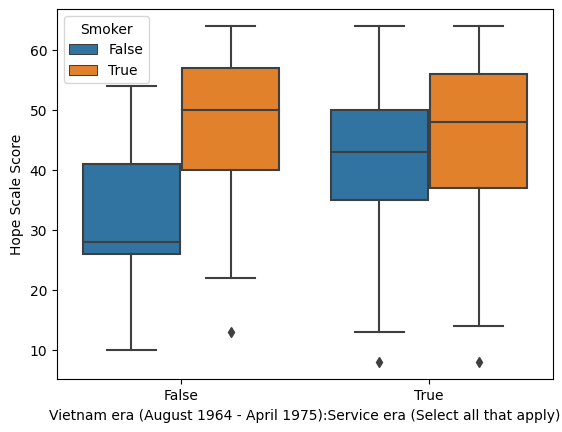

In [730]:
ax = sns.boxplot(data = df, x = 'Vietnam era (August 1964 - April 1975):Service era (Select all that apply)',
            y = "Hope Scale Score",
            hue = 'smoke a cigarette:After a long day how do you relax or cope with stress; are you more likely to: (Check all that apply)')
ax.legend(title = 'Smoker')

In [753]:
mean_score = np.mean(scores)
sd = np.std(scores)

In [767]:
important_combos = [[pcas[i], x] for i, x in enumerate(scores) if x> mean_score + sd*5]

In [779]:
df_cols = [x for x in df if not 'hope' in x.lower()]
for x in pca.components_[[0,1,4,5,6,9,158]]:
    vals = sorted(zip(x, df_cols), key = lambda x : x[0])[:5]
    print([y[1][:30] for y in vals])

['Number of Deployments:', 'Service Start Decade', 'What year did you begin your t', 'Seeking Value', 'Including yourself, how many p']
['Service Start Decade', 'What year did you begin your t', 'pca_0', 'Years Of Service', 'IndividualÂ\xa0annual income:']
['Years Of Service', 'pca_1', 'Length Of Service In Decades', 'About how long have you been r', 'What year did you begin your t']
['pca_1', 'What is your primary mode of t', 'What year did you begin your t', 'Service Start Decade', 'About how long have you been r']
['Has helped me feel more fulfil', 'There is a strong network of s', 'Have helped me feel more conne', 'Have helped me become healthie', 'My community is invested in ac']
['pca_1', 'What is your primary mode of t', 'pca_3', 'About how long have you been r', 'pca_2']
['Are you, or were you ever, an ', 'Do you currently have any medi', 'Recreational clubs (i.e. hocke', 'Do you participate in any spir', 'pca_3']


In [1]:
df

NameError: name 'df' is not defined

In [140]:
encodings['@'.join(sorted(df_orig_military['There are people I can depend on to help me if I really need it:To what extent do you disagree or agree with the following statements:'].dropna().unique()))]

{'Strongly Disagree': 0.0,
 'Disagree': 1.0,
 'Agree': 2.0,
 'Strongly Agree': 3.0,
 'Unknown': nan,
 'Not Applicable': nan}

In [184]:
df['Veterans Affairs (VA):What type of health insurance coverage do you currently have for yourself?Â\xa0 Please check all that apply.']

0       False
1        True
2       False
3       False
4       False
        ...  
2901     True
2902    False
2903     True
2904     True
2906     True
Name: Veterans Affairs (VA):What type of health insurance coverage do you currently have for yourself?Â  Please check all that apply., Length: 1009, dtype: bool

In [186]:
df_orig_military['Veterans Affairs (VA):What type of health insurance coverage do you currently have for yourself?Â\xa0 Please check all that apply.']

0       Veterans Affairs (VA)
1                         NaN
2       Veterans Affairs (VA)
3       Veterans Affairs (VA)
4       Veterans Affairs (VA)
                ...          
2901                      NaN
2902    Veterans Affairs (VA)
2903                      NaN
2904                      NaN
2906                      NaN
Name: Veterans Affairs (VA):What type of health insurance coverage do you currently have for yourself?Â  Please check all that apply., Length: 1009, dtype: object

In [111]:
school_labels = ['educa', 'school', 'college', 'student', 'study', 'degree']
job_labels = ['job', 'work', 'career', 'employ', 'salary', 'trade']
finance_labels = ['credit', 'financ', 'pay', 'salary', 'income', 'money', 'budget','savings',
                 'disability', 'claim']
hosing_labels = ['home', 'hous']
health_labels = ['condition', 'disease', 'insurance','sleep', 'covid', 'exercise', 
                 'sports','health', 'medical', 'weight', 'therapy', 'gym', 'smoke',
                 'drink', 'claim']
service_labels = ['service', 'tour', 'war', 'discharge', 'military', 'deploy']
persion_labels = ['relig', 'therapy', 'spirit', 'practice', 'smoke',
                  'drink', 'transport', 'race', 'gender', 'read']
community_labels = ['community']
hope_scale_labels = ['adult hope scale', 'hope scale score']
topics = ['Education', 'Employment', 'Financial', 'Home', 'Health', 
                              'Service', 'Community', 'Personal', 'Hope Scale']
topic_labels = [school_labels, job_labels, finance_labels, hosing_labels, health_labels,
                             service_labels, community_labels, persion_labels, hope_scale_labels]
pca_number = []
labels_dict = {}
questions_used = set()
df_cols = {x : i for i, x in enumerate([x for x in df_pca_cols if not 'hope' in col.lower()])}
for labelName, labels in zip(topics, topic_labels):
    
    labels_dict[labelName] = {col for col in df_pca_cols if any(x in col.lower() for x in labels)}
    questions_used = questions_used.union(labels_dict[labelName])
    indicies = [df_cols[question] for question in labels_dict[labelName]]
    pca_lim = 0
    for i, x in enumerate(pca.components_):
        pca_comp_sum = sum(abs(x)[indicies])
        if pca_comp_sum > pca_lim:
            pca_lim = pca_comp_sum
            pca_ind = i
    pca_number.append(pca_ind)
labels_dict['Other'] = {x for x in df_orig  if not x in questions_used}

In [123]:
pca_label = {}
pca_vecs_used = list({int(x.split('_')[1]) for x in df if 'pca' in x})
for comp_id in pca_vecs_used:
    pca_comp = pca.components_[comp_id]
    print([y[1] for y in sorted(zip(pca_comp, [y[:50] for y in df_pca_cols]), key = lambda x: abs(x[0]), reverse = True)][:5])
    print()
    pca_lim = 0
    for labelName, labels in zip(topics, topic_labels):
        indicies = [df_cols[question] for question in labels_dict[labelName]]
        pca_comp_sum = sum(pca_comp[indicies])
        if pca_comp_sum > pca_lim:
            pca_labelName = labelName
            pca_lim = pca_comp_sum
    pca_label[comp_id] = pca_labelName

['What is your current weight? (in pounds)Â\xa0', 'Height In Inches', 'Number of Deployments:', 'Service Start Decade', 'What year did you begin your time in the service? ']

['Number of Deployments:', 'Total Time Deployed in Months:', 'Height In Inches', 'Service Start Decade', 'What year did you begin your time in the service? ']

['Years Of Service', 'Seeking Value', 'Length Of Service In Decades', 'Total Time Deployed in Months:', 'About how long have you been receiving information']

['Seeking Value', 'Years Of Service', 'What is your primary mode of transportation?', 'What year did you begin your time in the service? ', 'Service Start Decade']

['Service Start Decade', 'What year did you begin your time in the service? ', 'Seeking Value', 'What is your current weight? (in pounds)Â\xa0', 'Height In Inches']

['Has helped me feel more fulfilled in my daily life', 'Have helped me feel more connected to my community', 'There is a strong network of support for active mi', 'My communit

In [100]:
labelName = 'Community'
labels = community_labels
labels_dict[labelName] = {col for col in df_pca_cols if any(x in col.lower() for x in labels)}
questions_used = questions_used.union(labels_dict[labelName])
indicies = [df_cols[question] for question in labels_dict[labelName]]

In [116]:
pca_label

{0: 'Health',
 1: 'Service',
 4: 'Health',
 5: 'Health',
 6: 'Home',
 7: 'Home',
 9: 'Community',
 16: 'Service'}

In [103]:
labels_dict[labelName]

{'About how long have you been receiving information or resources from community veteran service providers?',
 'Active military members/veterans can thrive in my community:To what extent do you disagree or agree with the following statements:',
 'Are highly responsive:To what extent do you disagree or agree with the following statements regardingÂ\xa0veteran serving organizations within your community?',
 'Care deeply about my well being:To what extent do you disagree or agree with the following statements regardingÂ\xa0veteran serving organizations within your community?',
 'Community is involved with veterans?',
 'Concerts, fairs, festivals, parades, or seasonal events:Which type of community events do you attend (select all that apply)?Â\xa0',
 'Educational seminars:Which type of community events do you attend (select all that apply)?Â\xa0',
 'Has empowered me:To what extent do you disagree or agree with the following statements regardingÂ\xa0veteran serving organizations within you

In [95]:
labels_dict[labelName] = {col for col in df_pca_cols if any(x in col.lower() for x in labels)}
questions_used = questions_used.union(labels_dict[labelName])
indicies = [df_cols[question] for question in labels_dict[labelName]]

In [96]:
indicies

[]

{'0', '1', '16', '4', '5', '6', '7', '9'}